In [1]:
##Data Exploration
##import the Library

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler
##Load data set
df=pd.read_csv(r"C:\Users\91878\Downloads\telcom_data.csv")

In [2]:
import logging
import pandas as pd

# Create logger
logger = logging.getLogger(__name__)
logger.setLevel(logging.DEBUG)

# Console handler
console_handler = logging.StreamHandler()
console_handler.setLevel(logging.DEBUG)

# File handler
file_handler = logging.FileHandler('telecom_debug.log')
file_handler.setLevel(logging.DEBUG)

# Formatter
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
console_handler.setFormatter(formatter)
file_handler.setFormatter(formatter)

# Add handlers to logger
logger.addHandler(console_handler)
logger.addHandler(file_handler)

# Function to load and log data
def load_and_log_telecom_data():
    try:
        logger.info("Loading the telecom dataset")

        df = pd.read_csv(r"C:\Users\91878\Downloads\telcom_data.csv")  # Adjust filename if needed

        logger.debug("Dataset loaded successfully")
        logger.info("First few rows of the dataset:")
        logger.debug("\n%s", df.head())

        logger.info("Summary statistics of the dataset:")
        logger.debug("\n%s", df.describe())

        return df

    except Exception as e:
        logger.error("Failed to load the telecom data: %s", e)
        raise

# Entry point
if __name__ == "__main__":
    telecom_df = load_and_log_telecom_data()


2025-04-23 22:05:20,844 - __main__ - INFO - Loading the telecom dataset
2025-04-23 22:05:22,432 - __main__ - DEBUG - Dataset loaded successfully
2025-04-23 22:05:22,434 - __main__ - INFO - First few rows of the dataset:
2025-04-23 22:05:22,435 - __main__ - DEBUG - 
      Bearer Id          Start  Start ms            End  End ms  Dur. (ms)  \
0  1.311450e+19   4/4/19 12:01     770.0  4/25/19 14:35   662.0  1823652.0   
1  1.311450e+19   4/9/19 13:04     235.0   4/25/19 8:15   606.0  1365104.0   
2  1.311450e+19   4/9/19 17:42       1.0  4/25/19 11:58   652.0  1361762.0   
3  1.311450e+19   4/10/19 0:31     486.0   4/25/19 7:36   171.0  1321509.0   
4  1.311450e+19  4/12/19 20:10     565.0  4/25/19 10:40   954.0  1089009.0   

           IMSI  MSISDN/Number          IMEI Last Location Name  ...  \
0  2.082014e+14   3.366496e+10  3.552121e+13        9.16457E+15  ...   
1  2.082019e+14   3.368185e+10  3.579401e+13            L77566A  ...   
2  2.082003e+14   3.376063e+10  3.528151e+13     

In [3]:
df

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,1.311450e+19,4/4/19 12:01,770.0,4/25/19 14:35,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16457E+15,...,15854611.0,2501332.00,8198936.00,9656251.00,278082303.0,1.434415e+07,171744450.0,8.814393e+06,36749741.0,308879636.0
1,1.311450e+19,4/9/19 13:04,235.0,4/25/19 8:15,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,...,20247395.0,19111729.00,18338413.00,17227132.00,608750074.0,1.170709e+06,526904238.0,1.505514e+07,53800391.0,653384965.0
2,1.311450e+19,4/9/19 17:42,1.0,4/25/19 11:58,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,...,19725661.0,14699576.00,17587794.00,6163408.00,229584621.0,3.956300e+05,410692588.0,4.215763e+06,27883638.0,279807335.0
3,1.311450e+19,4/10/19 0:31,486.0,4/25/19 7:36,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,...,21388122.0,15146643.00,13994646.00,1097942.00,799538153.0,1.084972e+07,749039933.0,1.279728e+07,43324218.0,846028530.0
4,1.311450e+19,4/12/19 20:10,565.0,4/25/19 10:40,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,...,15259380.0,18962873.00,17124581.00,415218.00,527707248.0,3.529801e+06,550709500.0,1.391032e+07,38542814.0,569138589.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149996,7.277830e+18,4/29/19 7:28,451.0,4/30/19 6:02,214.0,81230.0,2.082022e+14,3.365069e+10,3.548311e+13,D20434A,...,16191667.0,11763428.00,17883703.00,19678161.00,526609673.0,9.197207e+06,3264510.0,1.348742e+07,57628851.0,574175259.0
149997,7.349880e+18,4/29/19 7:28,483.0,4/30/19 10:41,187.0,97970.0,2.082019e+14,3.366345e+10,3.566051e+13,D10223C,...,13877234.0,8288284.00,19350146.00,21293148.00,626893062.0,4.735033e+06,712180387.0,2.457758e+06,39135081.0,666648844.0
149998,1.311450e+19,4/29/19 7:28,283.0,4/30/19 10:46,810.0,98249.0,2.082017e+14,3.362189e+10,3.572121e+13,T51102A,...,22660510.0,1855903.00,9963942.00,5065760.00,553539484.0,1.339432e+07,121100856.0,1.131473e+07,34912224.0,592786405.0
149999,1.311450e+19,4/29/19 7:28,696.0,4/30/19 10:40,327.0,97910.0,2.082021e+14,3.361962e+10,8.618620e+13,L88342B,...,8817106.0,8305402.00,3322253.00,13172589.00,352536971.0,2.529475e+06,814713113.0,1.406930e+06,29626096.0,371895920.0


In [4]:
#df.info()
logger.info('df')

2025-04-23 22:05:23,403 - __main__ - INFO - df


In [5]:
def preprocess_data(df):
    logger.info("Starting data preprocessing")
    
    # Handle missing values
    logger.debug("Checking for missing values")
    missing_values = df.isnull().sum()
    logger.debug("Missing values:\n%s", missing_values[missing_values > 0])
    df = df.fillna(df.mean(numeric_only=True))  # Example imputation
    logger.info("Missing values handled")
    
    # Encode categorical variables
    logger.debug("Encoding categorical variables")
    categorical_cols = df.select_dtypes(include=['object']).columns
    for col in categorical_cols:
        df[col] = LabelEncoder().fit_transform(df[col].astype(str))
    logger.info("Categorical variables encoded")
    
    # Scale numerical features
    logger.debug("Scaling numerical features")
    scaler = StandardScaler()
    numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
    df[numerical_cols] = scaler.fit_transform(df[numerical_cols])
    logger.info("Numerical features scaled")
    
    return df

# Call the function
telecom_df = preprocess_data(telecom_df)

2025-04-23 22:05:23,422 - __main__ - INFO - Starting data preprocessing
2025-04-23 22:05:23,425 - __main__ - DEBUG - Checking for missing values
2025-04-23 22:05:23,495 - __main__ - DEBUG - Missing values:
Bearer Id                                      991
Start                                            1
Start ms                                         1
End                                              1
End ms                                           1
Dur. (ms)                                        1
IMSI                                           570
MSISDN/Number                                 1066
IMEI                                           572
Last Location Name                            1153
Avg RTT DL (ms)                              27829
Avg RTT UL (ms)                              27812
Avg Bearer TP DL (kbps)                          1
Avg Bearer TP UL (kbps)                          1
TCP DL Retrans. Vol (Bytes)                  88146
TCP UL Retrans. Vol (Bytes)  

In [6]:
df.isnull().sum()

Bearer Id                                      991
Start                                            1
Start ms                                         1
End                                              1
End ms                                           1
Dur. (ms)                                        1
IMSI                                           570
MSISDN/Number                                 1066
IMEI                                           572
Last Location Name                            1153
Avg RTT DL (ms)                              27829
Avg RTT UL (ms)                              27812
Avg Bearer TP DL (kbps)                          1
Avg Bearer TP UL (kbps)                          1
TCP DL Retrans. Vol (Bytes)                  88146
TCP UL Retrans. Vol (Bytes)                  96649
DL TP < 50 Kbps (%)                            754
50 Kbps < DL TP < 250 Kbps (%)                 754
250 Kbps < DL TP < 1 Mbps (%)                  754
DL TP > 1 Mbps (%)             

In [7]:
##fill the value in mobile number
df["Bearer Id"]=df["Bearer Id"].fillna(df["Bearer Id"]).mode()[0]

In [8]:
df["Start"]=df["Start"].fillna(df["Start"]).mode()[0]

In [9]:
df["Start ms"]=df["Start ms"].fillna(df["Start ms"]).mode()[0]

In [10]:
df["Start ms"]=df["Start ms"].fillna(df["Start ms"]).mode()[0]

In [11]:
df["End"]=df["End"].fillna(df["End"]).mode()[0]

In [12]:
df["End ms"]=df["End ms"].fillna(df["End ms"]).mode()[0]

In [13]:
df["Dur. (ms)"]=df["Dur. (ms)"].fillna(df["Dur. (ms)"]).mode()[0]

In [14]:
df["IMSI"]=df["IMSI"].fillna(df["IMSI"]).mode()[0]

In [15]:
df["Last Location Name"]=df["Last Location Name"].fillna(df["Last Location Name"]).mode()[0]

In [16]:
df[['Avg RTT DL (ms)', 'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)','MSISDN/Number','IMEI','TCP DL Retrans. Vol (Bytes)','TCP UL Retrans. Vol (Bytes)','DL TP < 50 Kbps (%)']] = df[['Avg RTT DL (ms)', 'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)','MSISDN/Number','IMEI','TCP DL Retrans. Vol (Bytes)','TCP UL Retrans. Vol (Bytes)','DL TP < 50 Kbps (%)']].fillna(0)  # Replace NaNs with 0


In [17]:
df[['50 Kbps < DL TP < 250 Kbps (%)','250 Kbps < DL TP < 1 Mbps (%)','DL TP > 1 Mbps (%)','UL TP < 10 Kbps (%)','10 Kbps < UL TP < 50 Kbps (%)','50 Kbps < UL TP < 300 Kbps (%)']] = df[['50 Kbps < DL TP < 250 Kbps (%)','250 Kbps < DL TP < 1 Mbps (%)','DL TP > 1 Mbps (%)','UL TP < 10 Kbps (%)','10 Kbps < UL TP < 50 Kbps (%)','50 Kbps < UL TP < 300 Kbps (%)']].fillna(0)  # Replace NaNs with 0


In [18]:
df[['UL TP > 300 Kbps (%)','HTTP DL (Bytes)','HTTP UL (Bytes)','Activity Duration DL (ms)','Activity Duration UL (ms)']] = df[['UL TP > 300 Kbps (%)','HTTP DL (Bytes)','HTTP UL (Bytes)','Activity Duration DL (ms)','Activity Duration UL (ms)']].fillna(0)  # Replace NaNs with 0


In [19]:
df[['Dur. (ms)','Handset Manufacturer','Handset Type','Nb of sec with 125000B < Vol DL','Nb of sec with 1250B < Vol UL < 6250B']] = df[['Dur. (ms)','Handset Manufacturer','Handset Type','Nb of sec with 125000B < Vol DL','Nb of sec with 1250B < Vol UL < 6250B']].fillna(0)  # Replace NaNs with 0


In [20]:
df[['Nb of sec with 31250B < Vol DL < 125000B','Nb of sec with 37500B < Vol UL','Nb of sec with 6250B < Vol DL < 31250B','Nb of sec with 6250B < Vol UL < 37500B','Nb of sec with Vol DL < 6250B','Nb of sec with Vol UL < 1250B']] = df[['Nb of sec with 31250B < Vol DL < 125000B','Nb of sec with 37500B < Vol UL','Nb of sec with 6250B < Vol DL < 31250B','Nb of sec with 6250B < Vol UL < 37500B','Nb of sec with Vol DL < 6250B','Nb of sec with Vol UL < 1250B']].fillna(0)  # Replace NaNs with 0


In [21]:
df[['Total DL (Bytes)','Total UL (Bytes)','Avg Bearer TP UL (kbps)','Dur. (ms).1']] = df[['Total DL (Bytes)','Total UL (Bytes)','Avg Bearer TP UL (kbps)','Dur. (ms).1']].fillna(0)  # Replace NaNs with 0


In [22]:
df.isnull().sum()

Bearer Id                                   0
Start                                       0
Start ms                                    0
End                                         0
End ms                                      0
Dur. (ms)                                   0
IMSI                                        0
MSISDN/Number                               0
IMEI                                        0
Last Location Name                          0
Avg RTT DL (ms)                             0
Avg RTT UL (ms)                             0
Avg Bearer TP DL (kbps)                     0
Avg Bearer TP UL (kbps)                     0
TCP DL Retrans. Vol (Bytes)                 0
TCP UL Retrans. Vol (Bytes)                 0
DL TP < 50 Kbps (%)                         0
50 Kbps < DL TP < 250 Kbps (%)              0
250 Kbps < DL TP < 1 Mbps (%)               0
DL TP > 1 Mbps (%)                          0
UL TP < 10 Kbps (%)                         0
10 Kbps < UL TP < 50 Kbps (%)     

In [23]:
df.dtypes

Bearer Id                                   float64
Start                                        object
Start ms                                    float64
End                                          object
End ms                                      float64
Dur. (ms)                                   float64
IMSI                                        float64
MSISDN/Number                               float64
IMEI                                        float64
Last Location Name                           object
Avg RTT DL (ms)                             float64
Avg RTT UL (ms)                             float64
Avg Bearer TP DL (kbps)                     float64
Avg Bearer TP UL (kbps)                     float64
TCP DL Retrans. Vol (Bytes)                 float64
TCP UL Retrans. Vol (Bytes)                 float64
DL TP < 50 Kbps (%)                         float64
50 Kbps < DL TP < 250 Kbps (%)              float64
250 Kbps < DL TP < 1 Mbps (%)               float64
DL TP > 1 Mb

In [24]:
#Shape of Data Set
df.shape

(150001, 55)

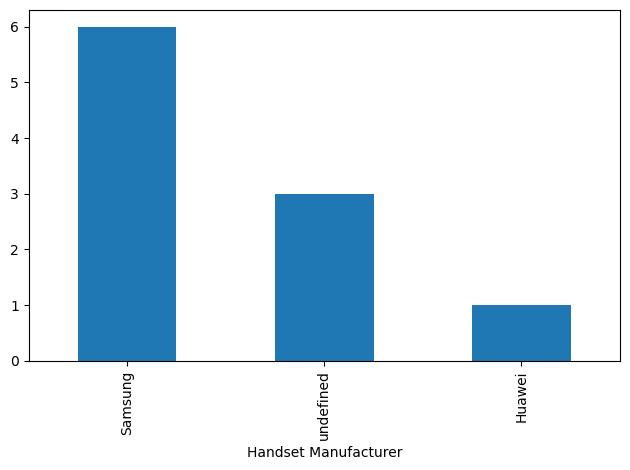

In [25]:
#counts how many times each unique Front Camera in the column
df['Handset Manufacturer'].head(10).value_counts().plot(kind='bar')
plt.tight_layout()
plt.show()

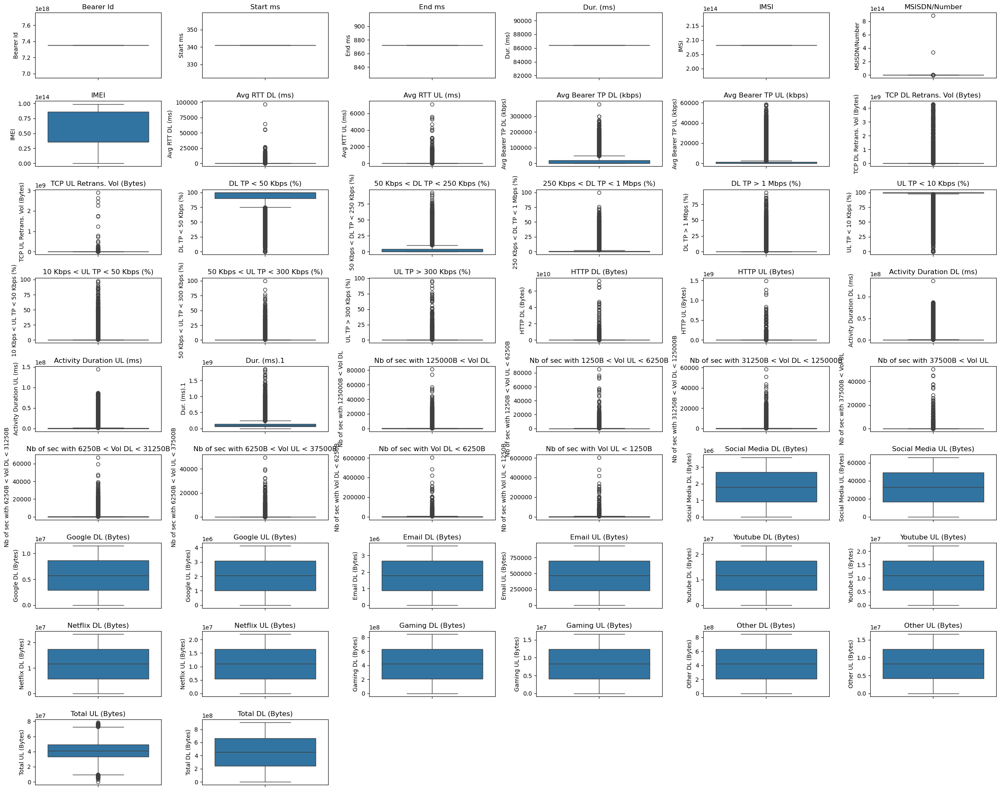

In [26]:
#check the all data outlaier by sub boxplot
numerical=df.select_dtypes(include=['float64','int32','int64']).columns
plt.figure(figsize=(24,19))
for i,col in enumerate(numerical,1):
    plt.subplot(9,6,i)
    sns.boxplot(y=df[col])
    plt.title(col)
plt.tight_layout()
plt.show()

In [27]:
import numpy as np

# Iterate only over numeric columns
for i in df.select_dtypes(include=["int64", "float64","int32"]).columns:
    
    # Calculate quantiles
    Q1 = df[i].quantile(0.25)
    Q2 = df[i].quantile(0.50)
    Q3 = df[i].quantile(0.75)
    
    # Calculate Inter-Quantile Range (IQR)
    IQR = Q3 - Q1
    
    # Calculate lower and upper limits for outliers
    LL = Q1 - 1.5 * IQR
    UL = Q3 + 1.5 * IQR
    
    # Print quantile and IQR information
    print(f"The first quantile for the column {i} is given by {Q1}")
    print(f"The second quantile for the column {i} is given by {Q2}")
    print(f"The third quantile for the column {i} is given by {Q3}")
    print(f"The interquantile range for the column {i} is given by {IQR}")
    print(f"The lower limit for the column {i} is given by {LL}")
    print(f"The upper limit for the column {i} is given by {UL}")
    
    # Count the number of outliers
    num_outliers = df[(df[i] < LL) | (df[i] > UL)].shape[0]
    print(f"The number of outliers for column {i} is given by {num_outliers}")
    
    # Impute outliers with the mean of the column
    df[i] = np.where((df[i] < LL) | (df[i] > UL), df[i].mean(), df[i])
    
    # Count the number of outliers after imputation
    num_outliers_after_imputation = df[(df[i] < LL) | (df[i] > UL)].shape[0]
    print(f"The number of outliers after imputation is given by {num_outliers_after_imputation}")
    
    # Add some spacing between columns for clarity
    print("\n" + "-"*50 + "\n")

The first quantile for the column Bearer Id is given by 7.34988e+18
The second quantile for the column Bearer Id is given by 7.34988e+18
The third quantile for the column Bearer Id is given by 7.34988e+18
The interquantile range for the column Bearer Id is given by 0.0
The lower limit for the column Bearer Id is given by 7.34988e+18
The upper limit for the column Bearer Id is given by 7.34988e+18
The number of outliers for column Bearer Id is given by 0
The number of outliers after imputation is given by 0

--------------------------------------------------

The first quantile for the column Start ms is given by 341.0
The second quantile for the column Start ms is given by 341.0
The third quantile for the column Start ms is given by 341.0
The interquantile range for the column Start ms is given by 0.0
The lower limit for the column Start ms is given by 341.0
The upper limit for the column Start ms is given by 341.0
The number of outliers for column Start ms is given by 0
The number of 

In [28]:
def iqr_technique(DFcolumn):
    Q1 = np.percentile(DFcolumn, 25)
    Q3 = np.percentile(DFcolumn, 75)
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range, upper_range

In [29]:
lower_limit_iqr,upper_limit_iqr = iqr_technique(df['MSISDN/Number'])

In [30]:
df['MSISDN/Number'] = np.where(df['MSISDN/Number']>upper_limit_iqr,upper_limit_iqr,np.where(df['MSISDN/Number']<lower_limit_iqr,lower_limit_iqr,df['MSISDN/Number']))

In [31]:
lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Avg Bearer TP DL (kbps)'])

In [32]:
df['Avg Bearer TP DL (kbps)'] = np.where(df['Avg Bearer TP DL (kbps)']>upper_limit_iqr,upper_limit_iqr,np.where(df['Avg Bearer TP DL (kbps)']<lower_limit_iqr,lower_limit_iqr,df['Avg Bearer TP DL (kbps)']))

In [33]:

lower_limit_iqr,upper_limit_iqr = iqr_technique(df['TCP DL Retrans. Vol (Bytes)'])

In [34]:
df['TCP DL Retrans. Vol (Bytes)'] = np.where(df['TCP DL Retrans. Vol (Bytes)']>upper_limit_iqr,upper_limit_iqr,np.where(df['TCP DL Retrans. Vol (Bytes)']<lower_limit_iqr,lower_limit_iqr,df['TCP DL Retrans. Vol (Bytes)']))

In [35]:

lower_limit_iqr,upper_limit_iqr = iqr_technique(df['TCP UL Retrans. Vol (Bytes)'])

In [36]:
df['TCP UL Retrans. Vol (Bytes)'] = np.where(df['TCP UL Retrans. Vol (Bytes)']>upper_limit_iqr,upper_limit_iqr,np.where(df['TCP UL Retrans. Vol (Bytes)']<lower_limit_iqr,lower_limit_iqr,df['TCP UL Retrans. Vol (Bytes)']))

In [37]:

lower_limit_iqr,upper_limit_iqr = iqr_technique(df['DL TP < 50 Kbps (%)'])

In [38]:
df['DL TP < 50 Kbps (%)'] = np.where(df['DL TP < 50 Kbps (%)']>upper_limit_iqr,upper_limit_iqr,np.where(df['DL TP < 50 Kbps (%)']<lower_limit_iqr,lower_limit_iqr,df['DL TP < 50 Kbps (%)']))

In [39]:

lower_limit_iqr,upper_limit_iqr = iqr_technique(df['50 Kbps < DL TP < 250 Kbps (%)'])

In [40]:
df['50 Kbps < DL TP < 250 Kbps (%)'] = np.where(df['50 Kbps < DL TP < 250 Kbps (%)']>upper_limit_iqr,upper_limit_iqr,np.where(df['50 Kbps < DL TP < 250 Kbps (%)']<lower_limit_iqr,lower_limit_iqr,df['50 Kbps < DL TP < 250 Kbps (%)']))

In [41]:

lower_limit_iqr,upper_limit_iqr = iqr_technique(df['HTTP DL (Bytes)'])

In [42]:
df['HTTP DL (Bytes)'] = np.where(df['HTTP DL (Bytes)']>upper_limit_iqr,upper_limit_iqr,np.where(df['HTTP DL (Bytes)']<lower_limit_iqr,lower_limit_iqr,df['HTTP DL (Bytes)']))

In [43]:

lower_limit_iqr,upper_limit_iqr = iqr_technique(df['HTTP UL (Bytes)'])

In [44]:
df['HTTP UL (Bytes)'] = np.where(df['HTTP UL (Bytes)']>upper_limit_iqr,upper_limit_iqr,np.where(df['HTTP UL (Bytes)']<lower_limit_iqr,lower_limit_iqr,df['HTTP UL (Bytes)']))

In [45]:

lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Activity Duration DL (ms)'])

In [46]:
df['Activity Duration DL (ms)'] = np.where(df['Activity Duration DL (ms)']>upper_limit_iqr,upper_limit_iqr,np.where(df['Activity Duration DL (ms)']<lower_limit_iqr,lower_limit_iqr,df['Activity Duration DL (ms)']))

In [47]:
lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Dur. (ms)'])

In [48]:
df['Dur. (ms)'] = np.where(df['Dur. (ms)']>upper_limit_iqr,upper_limit_iqr,np.where(df['Dur. (ms)']<lower_limit_iqr,lower_limit_iqr,df['Dur. (ms)']))

In [49]:
lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Nb of sec with 125000B < Vol DL'])

In [50]:
df['Nb of sec with 125000B < Vol DL'] = np.where(df['Nb of sec with 125000B < Vol DL']>upper_limit_iqr,upper_limit_iqr,np.where(df['Nb of sec with 125000B < Vol DL']<lower_limit_iqr,lower_limit_iqr,df['Nb of sec with 125000B < Vol DL']))

In [51]:
lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Nb of sec with 1250B < Vol UL < 6250B'])

In [52]:
df['Nb of sec with 1250B < Vol UL < 6250B'] = np.where(df['Nb of sec with 1250B < Vol UL < 6250B']>upper_limit_iqr,upper_limit_iqr,np.where(df['Nb of sec with 1250B < Vol UL < 6250B']<lower_limit_iqr,lower_limit_iqr,df['Nb of sec with 1250B < Vol UL < 6250B']))

In [53]:
lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Nb of sec with 31250B < Vol DL < 125000B'])

In [54]:
df['Nb of sec with 31250B < Vol DL < 125000B'] = np.where(df['Nb of sec with 31250B < Vol DL < 125000B']>upper_limit_iqr,upper_limit_iqr,np.where(df['Nb of sec with 31250B < Vol DL < 125000B']<lower_limit_iqr,lower_limit_iqr,df['Nb of sec with 31250B < Vol DL < 125000B']))

In [55]:
lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Nb of sec with 37500B < Vol UL'])

In [56]:
df['Nb of sec with 37500B < Vol UL'] = np.where(df['Nb of sec with 37500B < Vol UL']>upper_limit_iqr,upper_limit_iqr,np.where(df['Nb of sec with 37500B < Vol UL']<lower_limit_iqr,lower_limit_iqr,df['Nb of sec with 37500B < Vol UL']))

In [57]:
lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Nb of sec with 6250B < Vol DL < 31250B'])

In [58]:
df['Nb of sec with 6250B < Vol DL < 31250B'] = np.where(df['Nb of sec with 6250B < Vol DL < 31250B']>upper_limit_iqr,upper_limit_iqr,np.where(df['Nb of sec with 6250B < Vol DL < 31250B']<lower_limit_iqr,lower_limit_iqr,df['Nb of sec with 6250B < Vol DL < 31250B']))

In [59]:
lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Nb of sec with 6250B < Vol UL < 37500B'])

In [60]:
df['Nb of sec with 6250B < Vol UL < 37500B'] = np.where(df['Nb of sec with 6250B < Vol UL < 37500B']>upper_limit_iqr,upper_limit_iqr,np.where(df['Nb of sec with 6250B < Vol UL < 37500B']<lower_limit_iqr,lower_limit_iqr,df['Nb of sec with 6250B < Vol UL < 37500B']))

In [61]:

lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Dur. (ms).1'])

In [62]:
df['Dur. (ms).1'] = np.where(df['Dur. (ms).1']>upper_limit_iqr,upper_limit_iqr,np.where(df['Dur. (ms).1']<lower_limit_iqr,lower_limit_iqr,df['Dur. (ms).1']))

In [63]:
#using IQR Method to remove Outlaier
df['DL TP > 1 Mbps (%)']=np.where((df['DL TP > 1 Mbps (%)']<0)|(df['DL TP > 1 Mbps (%)']>0),df['DL TP > 1 Mbps (%)'].mode(),df['DL TP > 1 Mbps (%)'])

In [64]:
#using IQR Method to remove Outlaier
df['50 Kbps < UL TP < 300 Kbps (%)']=np.where((df['50 Kbps < UL TP < 300 Kbps (%)']<0)|(df['50 Kbps < UL TP < 300 Kbps (%)']>0),df['50 Kbps < UL TP < 300 Kbps (%)'].mode(),df['50 Kbps < UL TP < 300 Kbps (%)'])

In [65]:
#using IQR Method to remove Outlaier
df['10 Kbps < UL TP < 50 Kbps (%)']=np.where((df['10 Kbps < UL TP < 50 Kbps (%)']<0)|(df['10 Kbps < UL TP < 50 Kbps (%)']>0),df['10 Kbps < UL TP < 50 Kbps (%)'].mode(),df['10 Kbps < UL TP < 50 Kbps (%)'])

In [66]:
#using IQR Method to remove Outlaier
df['UL TP > 300 Kbps (%)']=np.where((df['UL TP > 300 Kbps (%)']<0)|(df['UL TP > 300 Kbps (%)']>0),df['UL TP > 300 Kbps (%)'].mode(),df['UL TP > 300 Kbps (%)'])

In [67]:

lower_limit_iqr,upper_limit_iqr = iqr_technique(df['Total UL (Bytes)'])

In [68]:
df['Total UL (Bytes)'] = np.where(df['Total UL (Bytes)']>upper_limit_iqr,upper_limit_iqr,np.where(df['Total UL (Bytes)']<lower_limit_iqr,lower_limit_iqr,df['Total UL (Bytes)']))

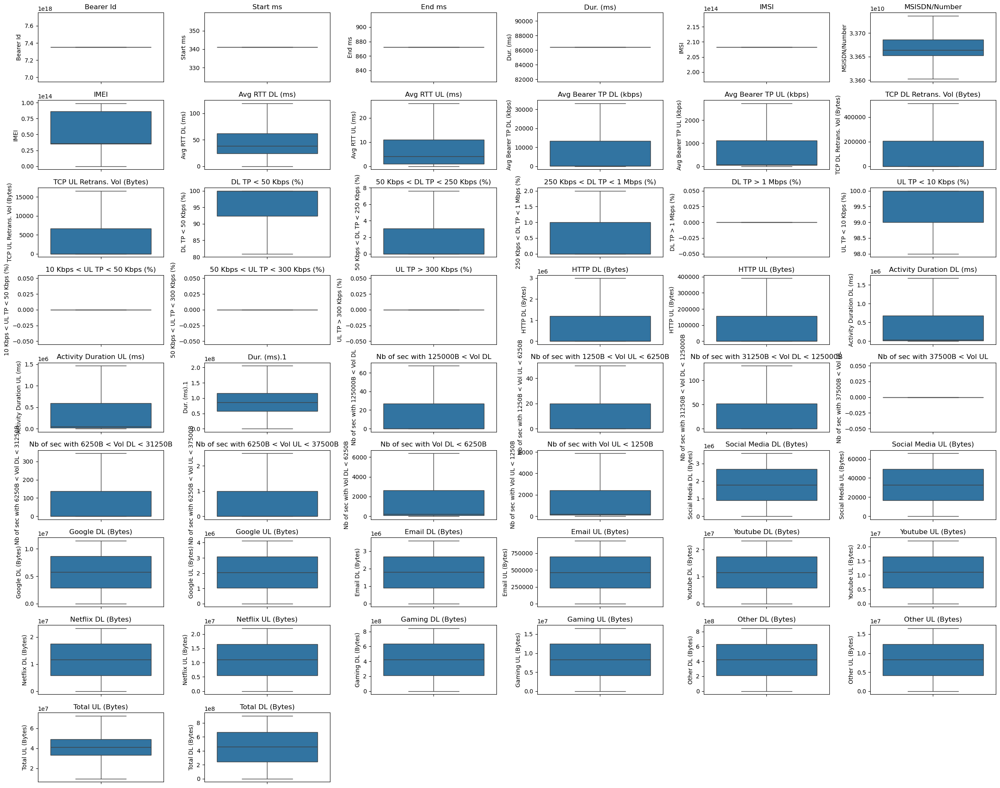

In [69]:
#check the all data outlaier by sub boxplot
numerical=df.select_dtypes(include=['float64','int32','int64']).columns
plt.figure(figsize=(24,19))
for i,col in enumerate(numerical,1):
    plt.subplot(9,6,i)
    sns.boxplot(y=df[col])
    plt.title(col)
plt.tight_layout()
plt.show()

In [70]:
##Step: User Overview Analysis
##Top 10 Handsets & Manufacturers

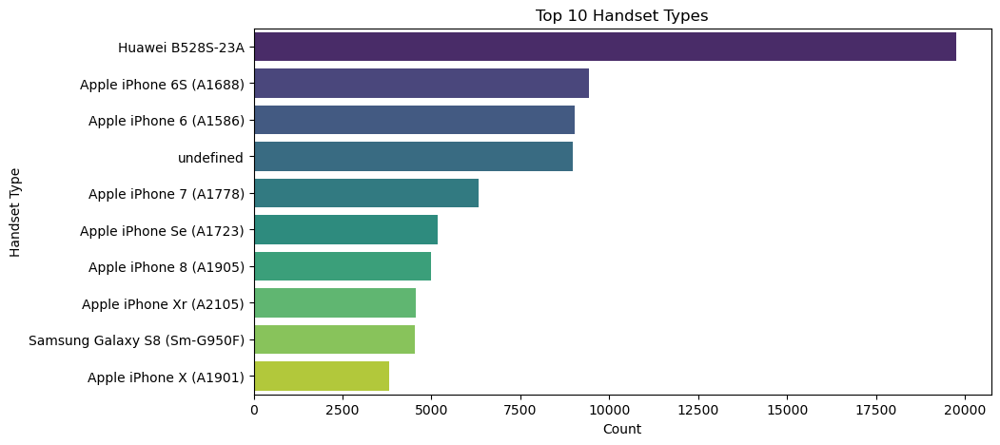

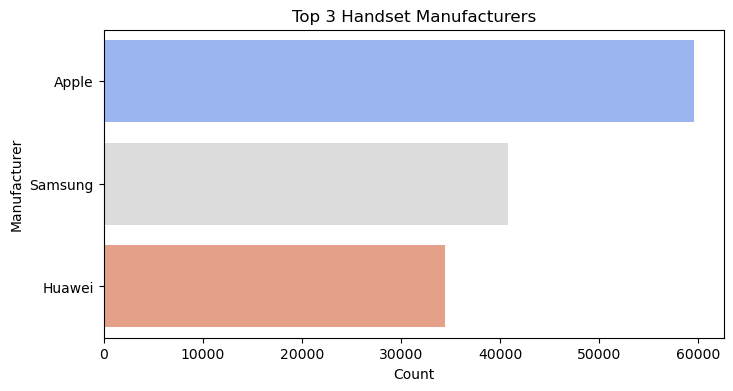

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns

# Top 10 Handsets
top_10_handsets = df['Handset Type'].value_counts().head(10)

plt.figure(figsize=(10, 5))
sns.barplot(x=top_10_handsets.values, y=top_10_handsets.index, palette='viridis')
plt.xlabel("Count")
plt.ylabel("Handset Type")
plt.title("Top 10 Handset Types")
plt.show()

# Top 3 Manufacturers
top_3_manufacturers = df['Handset Manufacturer'].value_counts().head(3)

plt.figure(figsize=(8, 4))
sns.barplot(x=top_3_manufacturers.values, y=top_3_manufacturers.index, palette='coolwarm')
plt.xlabel("Count")
plt.ylabel("Manufacturer")
plt.title("Top 3 Handset Manufacturers")
plt.show()



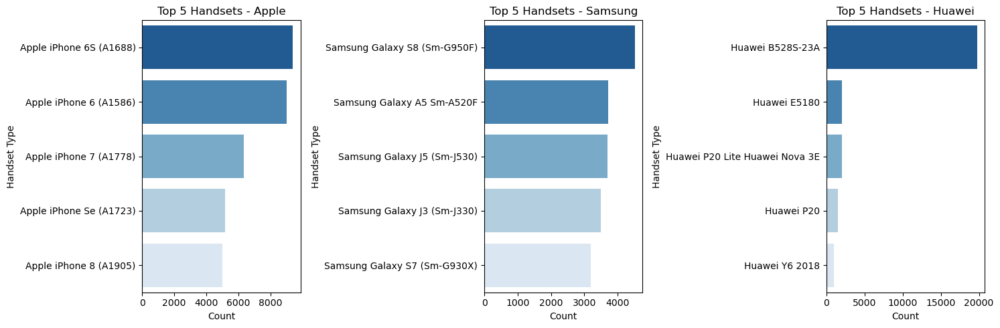

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sample DataFrame (Replace this with actual data)
# df = pd.read_csv("your_dataset.csv")

# Identify Top 3 Manufacturers
top_3_manufacturers = df['Handset Manufacturer'].value_counts().head(3).index.tolist()

# Identify Top 5 Handsets per Manufacturer
top_5_handsets_per_manufacturer = {}

for manufacturer in top_3_manufacturers:
    top_5_handsets = (
        df[df['Handset Manufacturer'] == manufacturer]
        ['Handset Type']
        .value_counts()
        .head(5)
    )
    top_5_handsets_per_manufacturer[manufacturer] = top_5_handsets

# Visualization
plt.figure(figsize=(15, 5))

for i, (manufacturer, handsets) in enumerate(top_5_handsets_per_manufacturer.items(), 1):
    plt.subplot(1, 3, i)  # Create 3 subplots (1 row, 3 columns)
    sns.barplot(x=handsets.values, y=handsets.index, palette="Blues_r")
    
    # Titles and Labels
    plt.title(f"Top 5 Handsets - {manufacturer}", fontsize=12)
    plt.xlabel("Count", fontsize=10)
    plt.ylabel("Handset Type", fontsize=10)

plt.tight_layout()
plt.show()


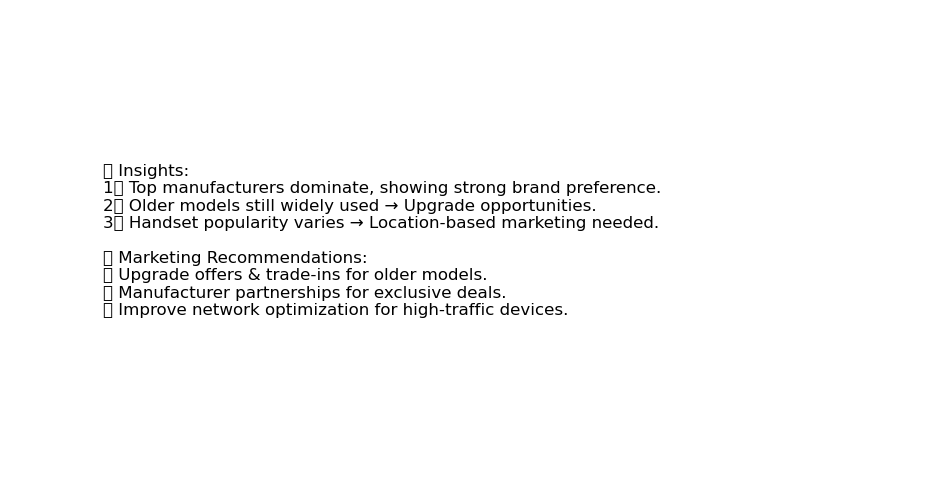

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size
plt.figure(figsize=(12, 6))

# Interpretation & Recommendations as text on an image
text = """
📊 Insights:
1️⃣ Top manufacturers dominate, showing strong brand preference.
2️⃣ Older models still widely used → Upgrade opportunities.
3️⃣ Handset popularity varies → Location-based marketing needed.

📢 Marketing Recommendations:
✅ Upgrade offers & trade-ins for older models.
✅ Manufacturer partnerships for exclusive deals.
✅ Improve network optimization for high-traffic devices.
"""

plt.text(0.1, 0.5, text, fontsize=12, va='center', wrap=True)
plt.axis('off')
plt.show()


In [74]:
##User Behavior on Applications

In [75]:
## 1.1 - Your employer wants to have an overview of the users’ behavior on those applications.     
##Aggregate per user the following information in the column   

# Rename columns to match aggregation keys (if necessary)
df.rename(columns={
    'MSISDN/Number': 'MSISDN',
    'Dur. (ms)': 'session_duration',
    'Total DL (Bytes)': 'total_DL',
    'Total UL (Bytes)': 'total_UL'
}, inplace=True)

# Add session count (assuming each row represents one session)
df['session_count'] = 1

# Group by MSISDN and aggregate data
app_metrics = df.groupby('MSISDN').agg({
    'session_count': 'sum',
    'session_duration': 'sum',
    'total_DL': 'sum',
    'total_UL': 'sum'
}).reset_index()

# Display the first few rows
print(app_metrics.head())


         MSISDN  session_count  session_duration     total_DL    total_UL
0  3.360300e+10              1           86399.0  135431339.0  48797951.0
1  3.360300e+10              1           86399.0  241745779.0  54799308.0
2  3.360300e+10              1           86399.0  788013927.0  31764287.0
3  3.360301e+10              2          172798.0  559774090.0  82689008.0
4  3.360301e+10              1           86399.0  809319344.0  54693881.0


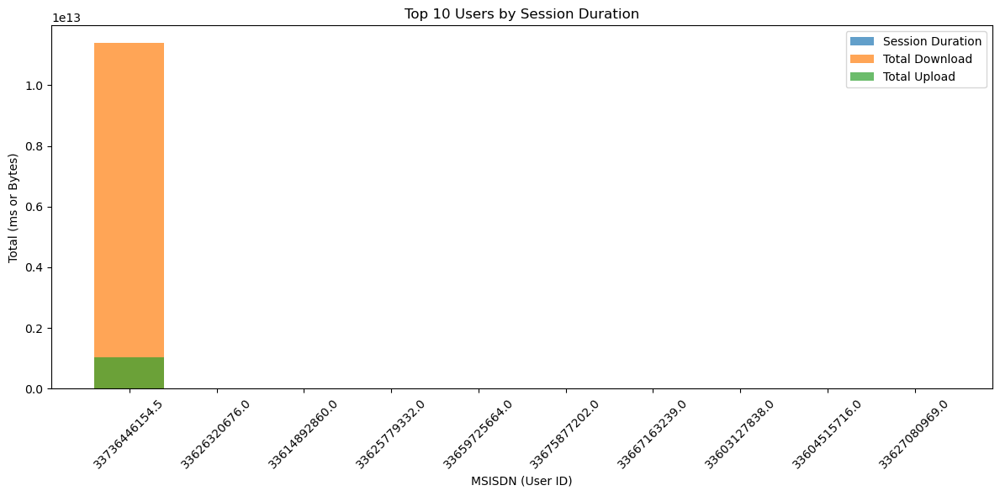

In [76]:
##To visualize the aggregated user behavior data (app_metrics), you can use Matplotlib or Seaborn. Here's a simple plot example using Matplotlib to show:
##Total Session Duration
##Total Download
##Total Upload
##for the top 10 users (based on total session duration or any metric you prefer

import matplotlib.pyplot as plt

# Sort by session_duration and take top 10 users
top_users = app_metrics.sort_values(by='session_duration', ascending=False).head(10)

# Plot
plt.figure(figsize=(12, 6))
plt.bar(top_users['MSISDN'].astype(str), top_users['session_duration'], label='Session Duration', alpha=0.7)
plt.bar(top_users['MSISDN'].astype(str), top_users['total_DL'], label='Total Download', alpha=0.7)
plt.bar(top_users['MSISDN'].astype(str), top_users['total_UL'], label='Total Upload', alpha=0.7)

plt.xlabel('MSISDN (User ID)')
plt.ylabel('Total (ms or Bytes)')
plt.title('Top 10 Users by Session Duration')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


In [77]:
###Exploratory Data Analysis (EDA)

###Compute summary statistics:

In [78]:
##describe the dataset
df.describe()


,Bearer Id,Start ms,End ms,session_duration,IMSI,MSISDN,IMEI,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),...,Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),total_UL,total_DL,session_count
count,1.500010e+05,150001.0,150001.0,150001.0,1.500010e+05,1.500010e+05,1.500010e+05,150001.000000,150001.000000,150001.000000,...,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,150001.0
mean,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.367102e+10,4.828970e+13,42.201427,6.303719,7376.582564,...,1.100941e+07,1.162685e+07,1.100175e+07,4.220447e+08,8.288398e+06,4.211005e+08,8.264799e+06,4.111971e+07,4.546404e+08,1.0
std,9.754657e+06,0.0,0.0,0.0,3.775638e+02,3.585794e+07,2.257219e+13,29.984923,6.542240,11088.062609,...,6.345423e+06,6.725218e+06,6.359490e+06,2.439675e+08,4.782700e+06,2.432050e+08,4.769004e+06,1.119710e+07,2.441449e+08,0.0
min,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.360300e+10,0.000000e+00,0.000000,0.000000,0.000000,...,1.050000e+02,4.200000e+01,3.500000e+01,2.516000e+03,5.900000e+01,3.290000e+03,1.480000e+02,9.615494e+06,0.000000e+00,1.0
25%,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.365221e+10,3.544691e+13,24.000000,1.000000,43.000000,...,5.517965e+06,5.777156e+06,5.475981e+06,2.104733e+08,4.128476e+06,2.101869e+08,4.145943e+06,3.324942e+07,2.431057e+08,1.0
50%,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.366395e+10,3.572151e+13,38.000000,4.000000,63.000000,...,1.101345e+07,1.164222e+07,1.099638e+07,4.234081e+08,8.291208e+06,4.218030e+08,8.267071e+06,4.112093e+07,4.558409e+08,1.0
75%,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.368591e+10,8.611970e+13,62.000000,11.000000,13299.957260,...,1.651556e+07,1.747048e+07,1.650727e+07,6.331742e+08,1.243162e+07,6.316918e+08,1.238415e+07,4.900537e+07,6.657051e+08,1.0
max,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.373645e+10,9.900120e+13,119.000000,26.000000,33185.393151,...,2.201196e+07,2.325919e+07,2.201196e+07,8.434419e+08,1.655879e+07,8.434425e+08,1.655882e+07,7.263929e+07,9.029696e+08,1.0


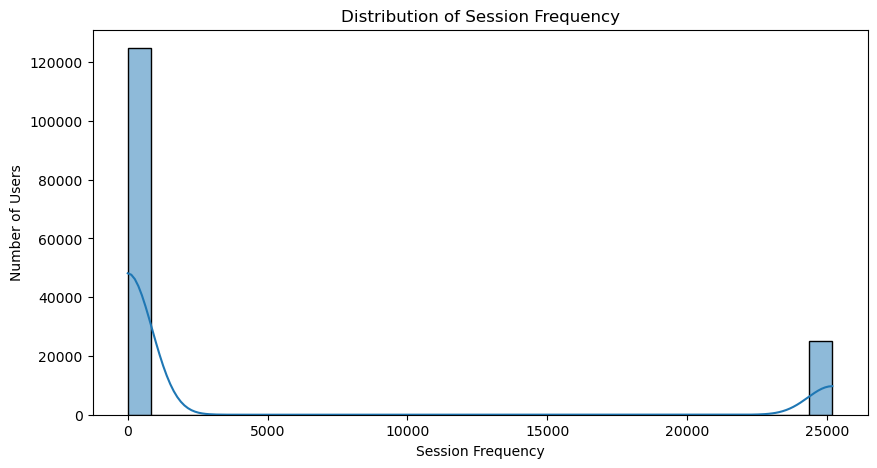

In [79]:
# Count number of sessions per user
session_frequency = df.groupby("MSISDN").size().reset_index(name="session_frequency")

# Merge it back with the original DataFrame if needed
session_analysis = df.merge(session_frequency, on="MSISDN")

# Now plot
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.histplot(session_analysis['session_frequency'], bins=30, kde=True)
plt.xlabel("Session Frequency")
plt.ylabel("Number of Users")
plt.title("Distribution of Session Frequency")
plt.show()


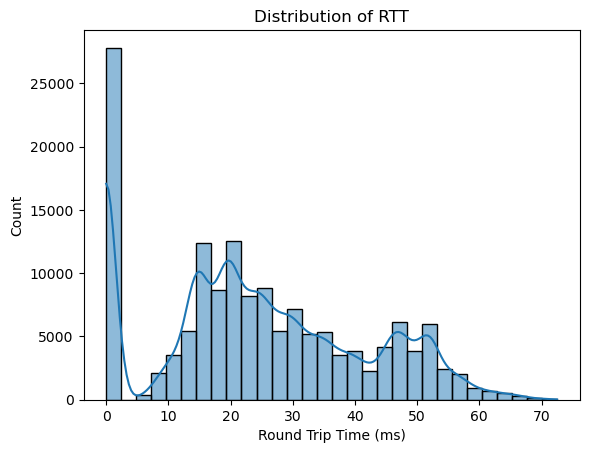

In [80]:
##User Experience Analysis:
##Examine network parameters (TCP retransmission, RTT, throughput).
# Create an overall RTT column (if both RTT DL & RTT UL exist)
df['RTT'] = (df['Avg RTT DL (ms)'] + df['Avg RTT UL (ms)']) / 2
##df.drop(['Avg RTT DL (ms)', 'Avg RTT UL (ms)'], axis=1, inplace=True)


# Check distribution
sns.histplot(df['RTT'], kde=True, bins=30)
plt.title("Distribution of RTT")
plt.xlabel("Round Trip Time (ms)")
plt.show()


In [81]:
# Create the Total Data (DL+UL) column
df['Total Data (DL+UL)'] = df['total_DL'] + df['total_UL']

In [82]:
##Create new columns Total TCP Retransmission
df['Total TCP Retransmission'] = df['TCP DL Retrans. Vol (Bytes)'] + df['TCP UL Retrans. Vol (Bytes)']

In [83]:
##df.drop(['TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)'], axis=1, inplace=True)


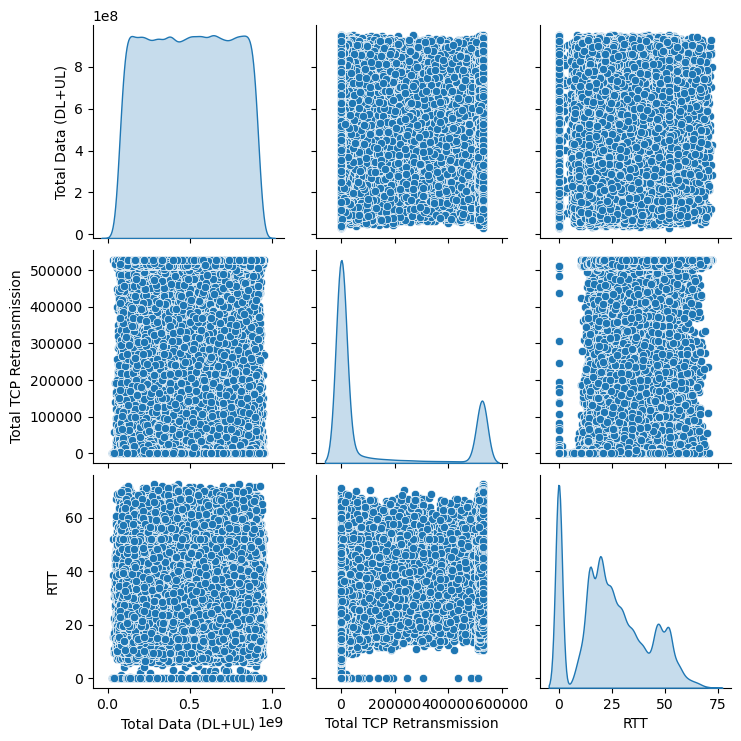

In [84]:
sns.pairplot(df[[ 'Total Data (DL+UL)', 'Total TCP Retransmission', 'RTT']], diag_kind='kde')
plt.show()



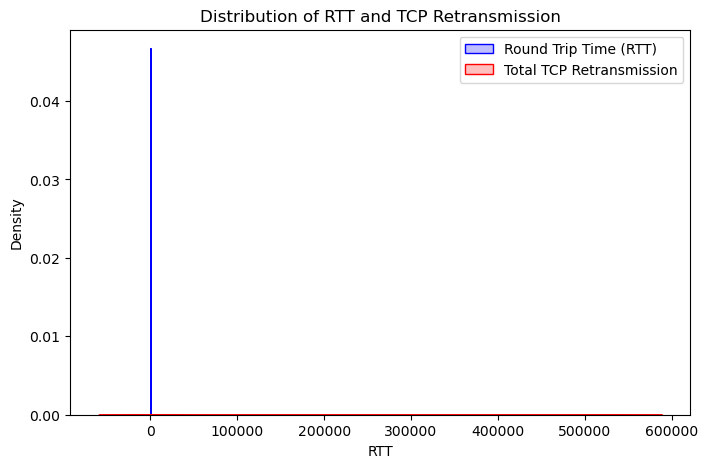

In [85]:
plt.figure(figsize=(8, 5))
sns.kdeplot(df['RTT'], shade=True, color="blue", label="Round Trip Time (RTT)")
sns.kdeplot(df['Total TCP Retransmission'], shade=True, color="red", label="Total TCP Retransmission")
plt.title("Distribution of RTT and TCP Retransmission")
plt.legend()
plt.show()


In [86]:
### Visualizing relationships between categorical variables.
import plotly.graph_objects as go

fig = go.Figure(go.Sankey(
    node=dict(label=['Apple', 'Samsung', 'Huawei', 'High Data Users', 'Low Data Users']),
    link=dict(
        source=[0, 0, 1, 2, 2],
        target=[3, 4, 3, 4, 3],
        value=[10, 5, 8, 6, 4]
    )
))

fig.show()


In [87]:
##Task 1.2 
## expected to report about the following using Python script and slide 
##Describe all relevant variables and associated data types (slide)
df.describe()

,Bearer Id,Start ms,End ms,session_duration,IMSI,MSISDN,IMEI,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),...,Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),total_UL,total_DL,session_count,RTT,Total Data (DL+UL),Total TCP Retransmission
count,1.500010e+05,150001.0,150001.0,150001.0,1.500010e+05,1.500010e+05,1.500010e+05,150001.000000,150001.000000,150001.000000,...,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,150001.0,150001.000000,1.500010e+05,150001.000000
mean,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.367102e+10,4.828970e+13,42.201427,6.303719,7376.582564,...,4.220447e+08,8.288398e+06,4.211005e+08,8.264799e+06,4.111971e+07,4.546404e+08,1.0,24.252573,4.957601e+08,132431.967997
std,9.754657e+06,0.0,0.0,0.0,3.775638e+02,3.585794e+07,2.257219e+13,29.984923,6.542240,11088.062609,...,2.439675e+08,4.782700e+06,2.432050e+08,4.769004e+06,1.119710e+07,2.441449e+08,0.0,17.043071,2.443794e+08,216435.737756
min,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.360300e+10,0.000000e+00,0.000000,0.000000,0.000000,...,2.516000e+03,5.900000e+01,3.290000e+03,1.480000e+02,9.615494e+06,0.000000e+00,1.0,0.000000,2.895611e+07,0.000000
25%,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.365221e+10,3.544691e+13,24.000000,1.000000,43.000000,...,2.104733e+08,4.128476e+06,2.101869e+08,4.145943e+06,3.324942e+07,2.431057e+08,1.0,14.000000,2.844764e+08,0.000000
50%,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.366395e+10,3.572151e+13,38.000000,4.000000,63.000000,...,4.234081e+08,8.291208e+06,4.218030e+08,8.267071e+06,4.112093e+07,4.558409e+08,1.0,22.500000,4.968612e+08,0.000000
75%,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.368591e+10,8.611970e+13,62.000000,11.000000,13299.957260,...,6.331742e+08,1.243162e+07,6.316918e+08,1.238415e+07,4.900537e+07,6.657051e+08,1.0,36.000000,7.065448e+08,214214.000000
max,7.349880e+18,341.0,872.0,86399.0,2.082014e+14,3.373645e+10,9.900120e+13,119.000000,26.000000,33185.393151,...,8.434419e+08,1.655879e+07,8.434425e+08,1.655882e+07,7.263929e+07,9.029696e+08,1.0,72.500000,9.526413e+08,529287.500000


In [88]:
#### Conduct a Non-Graphical Univariate Analysis by computing dispersion parameters 
# for each quantitative variable and provide useful interpretation.

import pandas as pd

# Filter numeric (quantitative) variables
numeric_cols = df.select_dtypes(include='number').columns

# Initialize list to collect summary rows
summary_rows = []

for col in numeric_cols:
    col_data = df[col].dropna()
    if col_data.nunique() <= 1:
        continue  # Skip constant or invalid columns

    # Compute dispersion parameters
    min_val = col_data.min()
    max_val = col_data.max()
    value_range = max_val - min_val
    variance = col_data.var()
    std_dev = col_data.std()
    q1 = col_data.quantile(0.25)
    q3 = col_data.quantile(0.75)
    iqr = q3 - q1
    mean_val = col_data.mean()
    cv = std_dev / mean_val if mean_val != 0 else np.nan

    # Add results to list
    summary_rows.append({
        'Variable': col,
        'Min': round(min_val, 2),
        'Max': round(max_val, 2),
        'Range': round(value_range, 2),
        'Variance': round(variance, 2),
        'Std Dev': round(std_dev, 2),
        'IQR': round(iqr, 2),
        'CV (std/mean)': round(cv, 2)
    })

# Create summary DataFrame
dispersion_summary = pd.DataFrame(summary_rows)

# Display the summary
print(dispersion_summary)


                                    Variable           Min           Max  \
0                                     MSISDN  3.360300e+10  3.373645e+10   
1                                       IMEI  0.000000e+00  9.900120e+13   
2                            Avg RTT DL (ms)  0.000000e+00  1.190000e+02   
3                            Avg RTT UL (ms)  0.000000e+00  2.600000e+01   
4                    Avg Bearer TP DL (kbps)  0.000000e+00  3.318539e+04   
5                    Avg Bearer TP UL (kbps)  0.000000e+00  2.729000e+03   
6                TCP DL Retrans. Vol (Bytes)  0.000000e+00  5.126625e+05   
7                TCP UL Retrans. Vol (Bytes)  0.000000e+00  1.662500e+04   
8                        DL TP < 50 Kbps (%)  8.095000e+01  1.000000e+02   
9             50 Kbps < DL TP < 250 Kbps (%)  0.000000e+00  7.630000e+00   
10             250 Kbps < DL TP < 1 Mbps (%)  0.000000e+00  2.000000e+00   
11                       UL TP < 10 Kbps (%)  9.800000e+01  1.000000e+02   
12          

Skipping Bearer Id: Not enough valid data.
Skipping Start ms: Not enough valid data.
Skipping End ms: Not enough valid data.
Skipping session_duration: Not enough valid data.
Skipping IMSI: Not enough valid data.


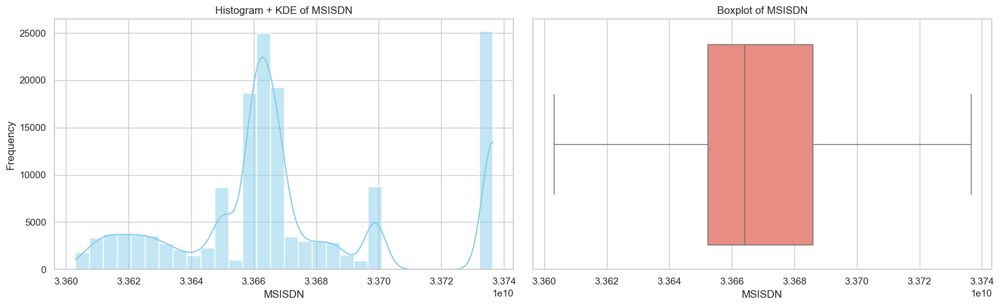

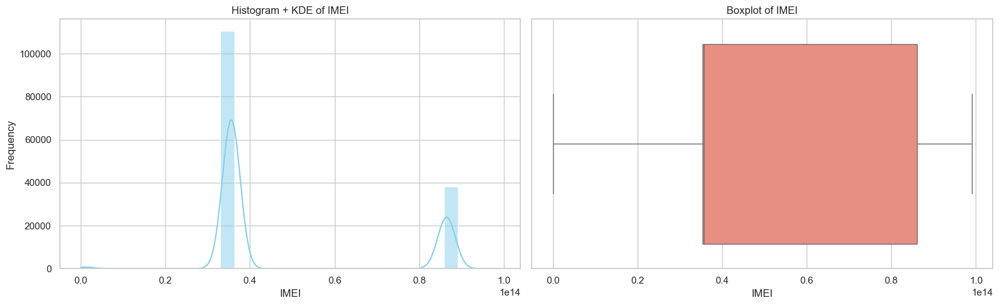

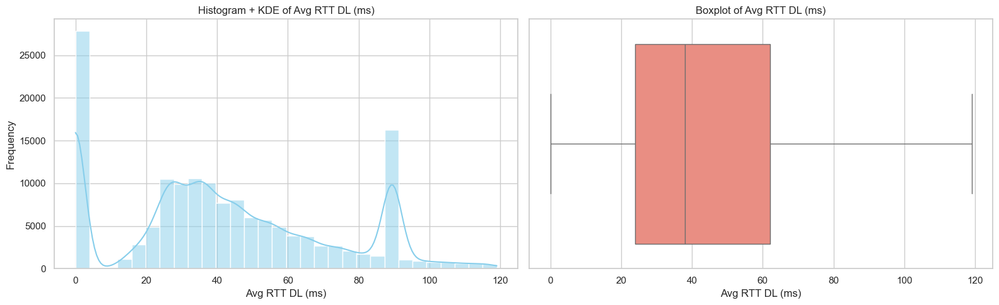

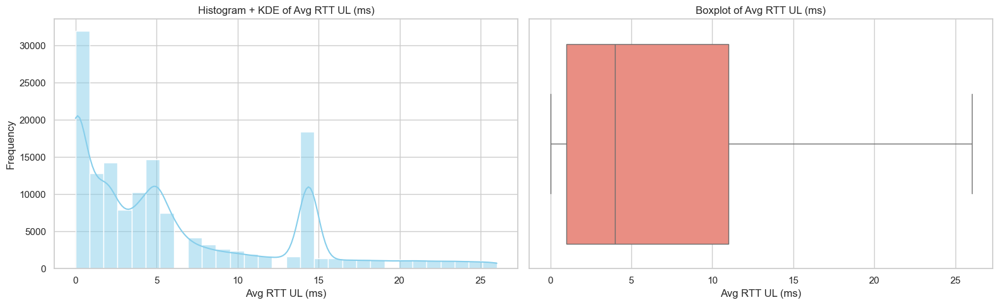

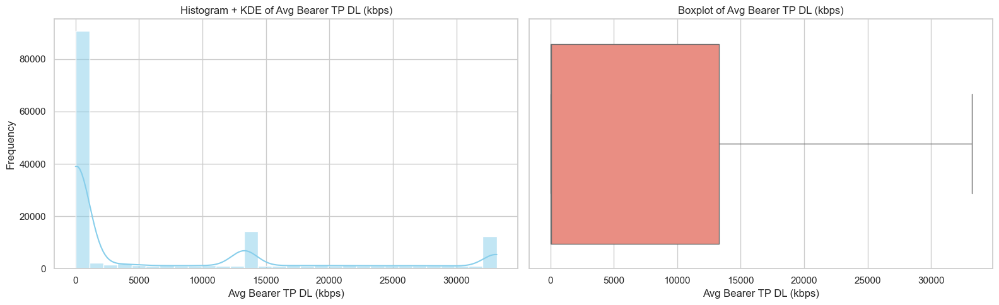

...

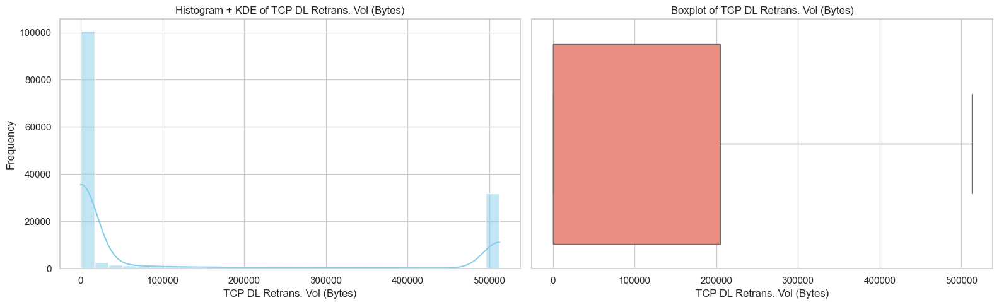

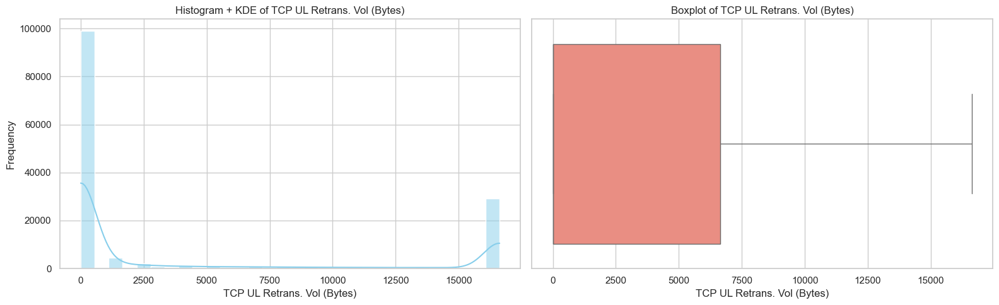

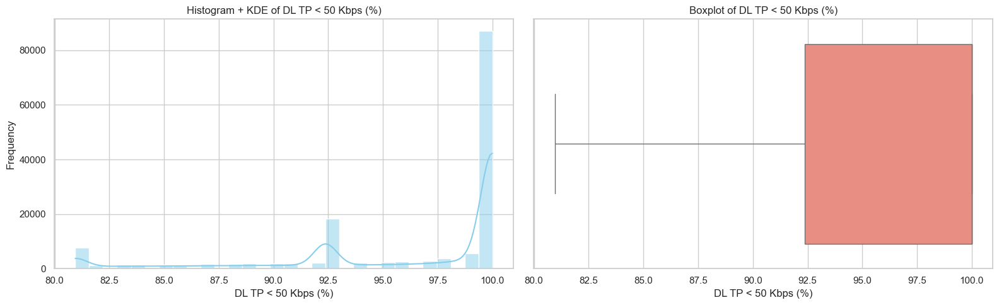

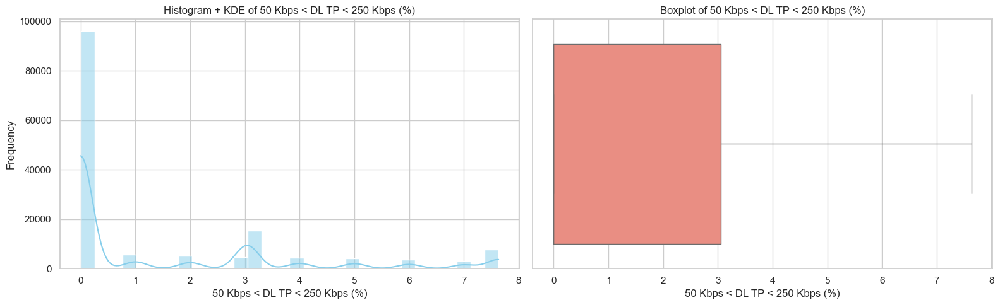

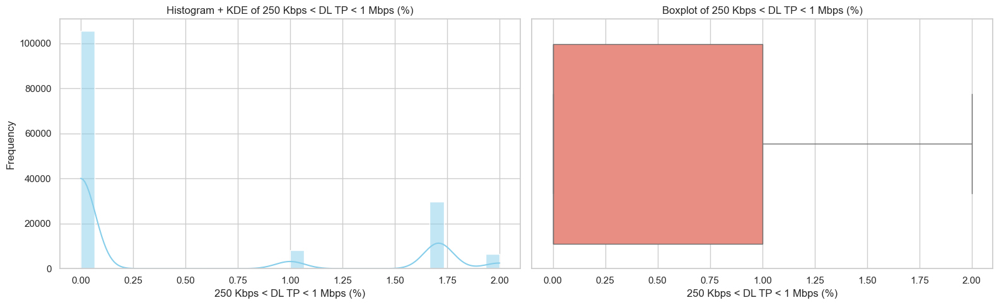

Skipping DL TP > 1 Mbps (%): Not enough valid data.


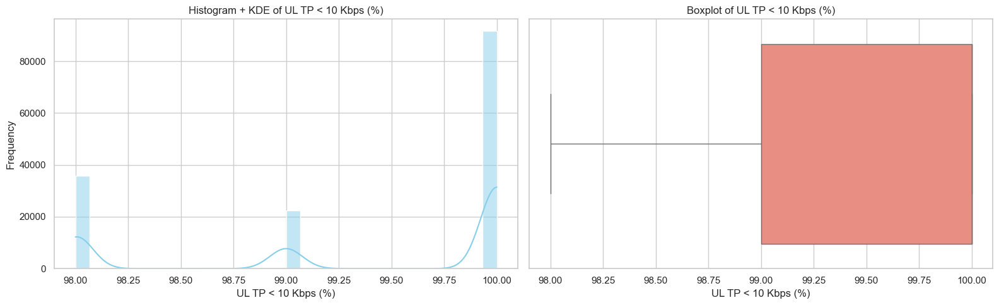

Skipping 10 Kbps < UL TP < 50 Kbps (%): Not enough valid data.
Skipping 50 Kbps < UL TP < 300 Kbps (%): Not enough valid data.
Skipping UL TP > 300 Kbps (%): Not enough valid data.


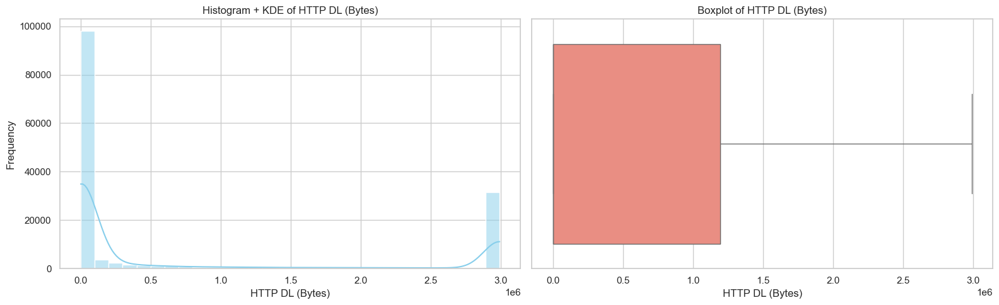

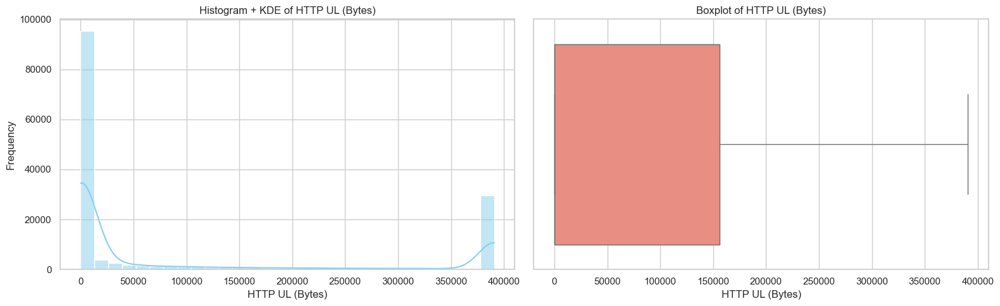

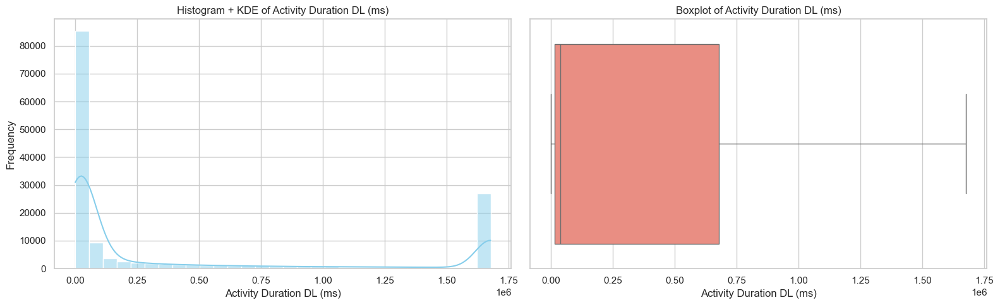

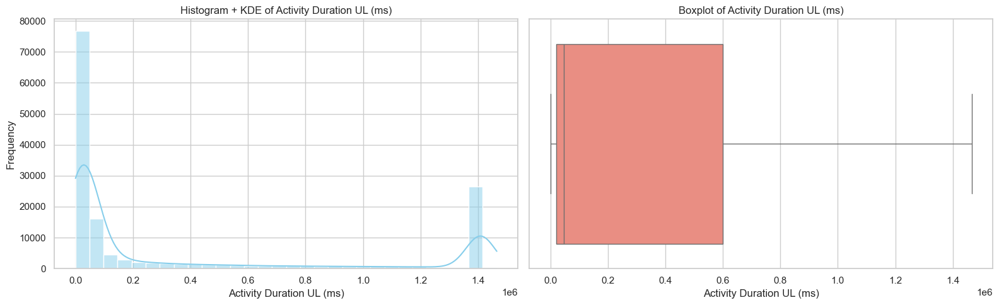

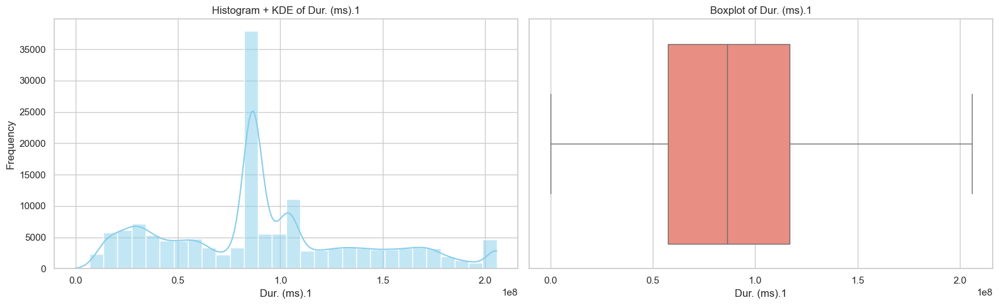

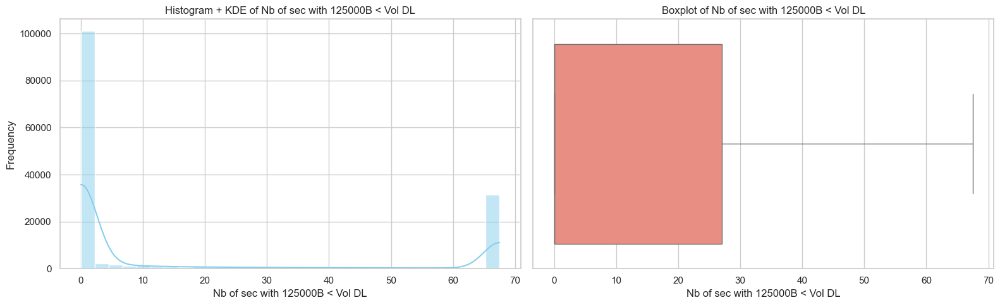

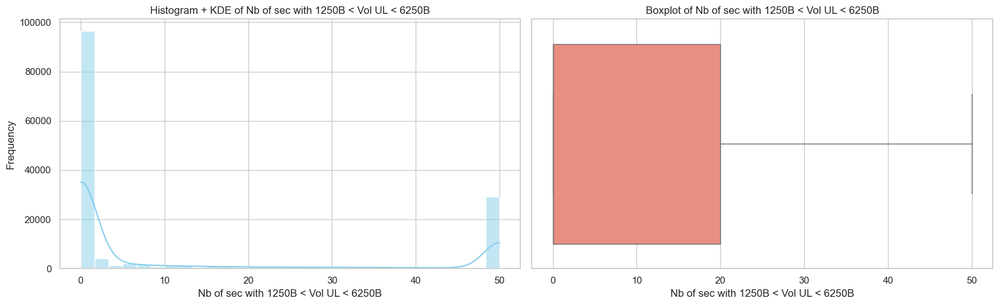

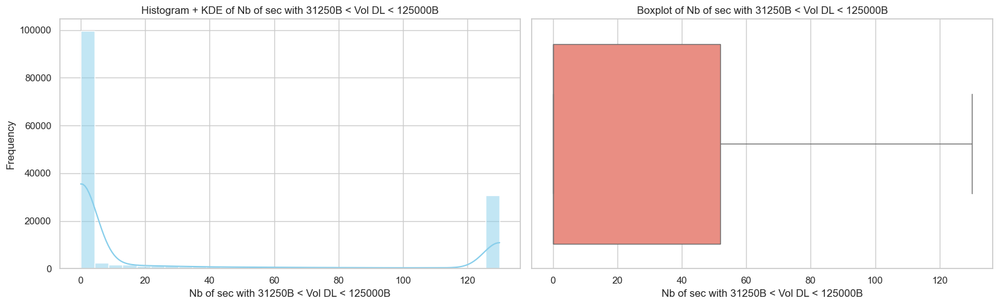

Skipping Nb of sec with 37500B < Vol UL: Not enough valid data.


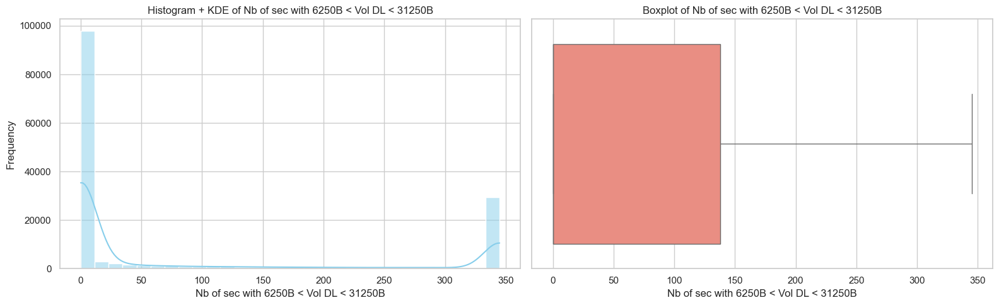

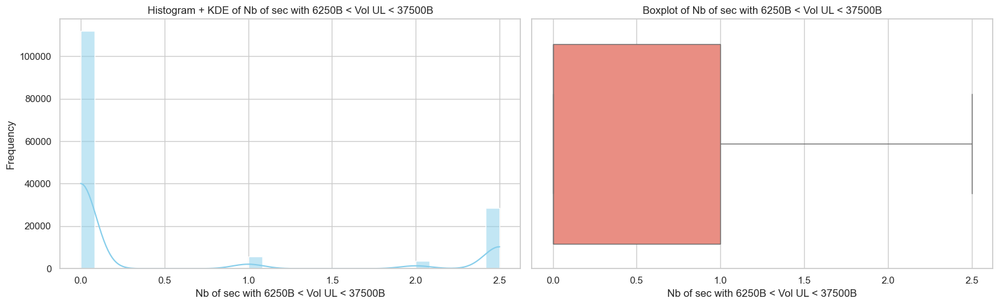

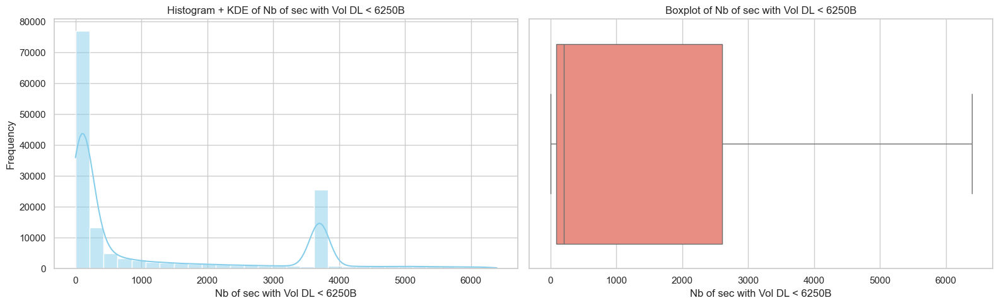

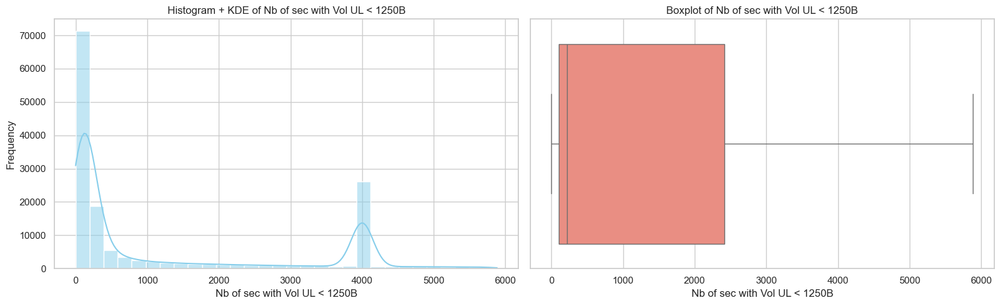

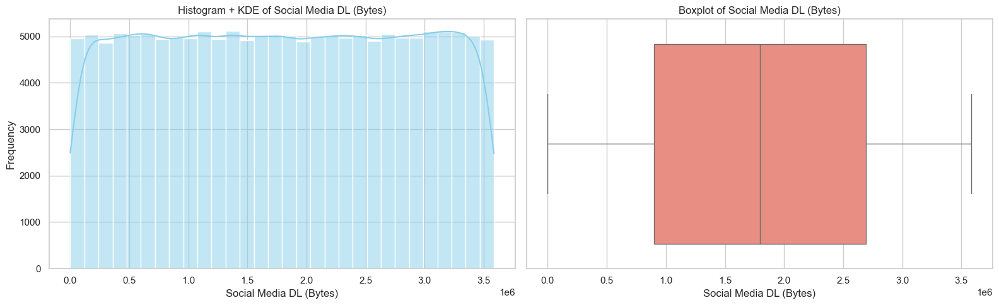

...

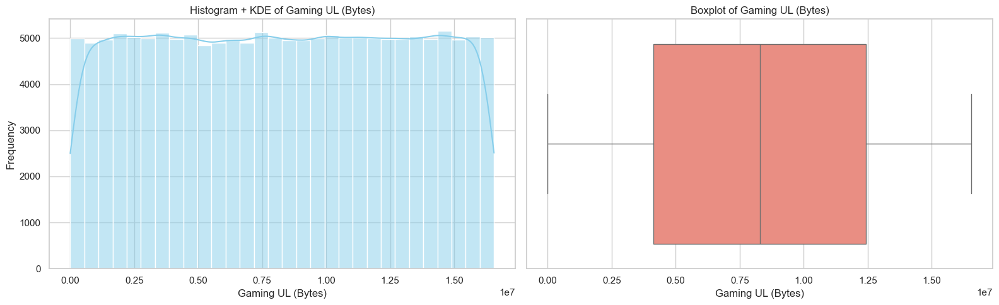

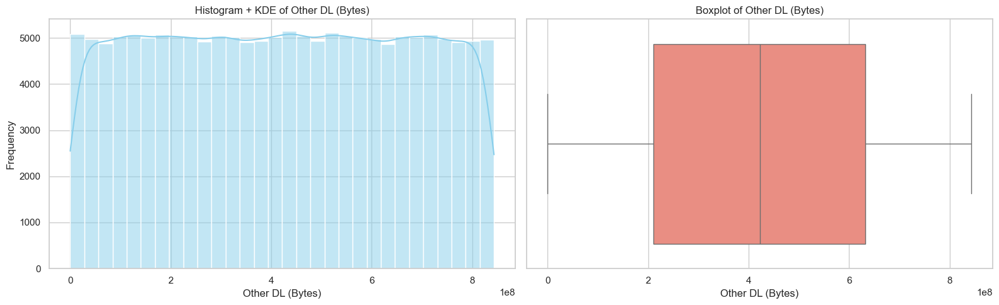

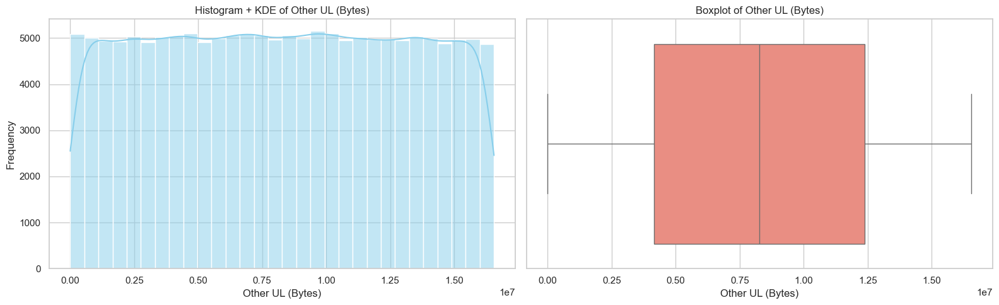

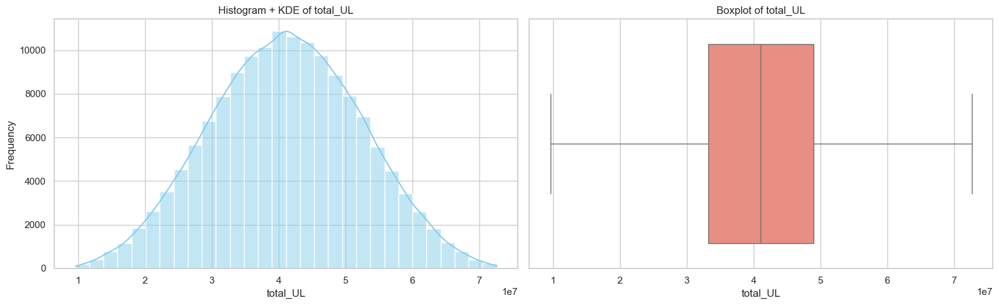

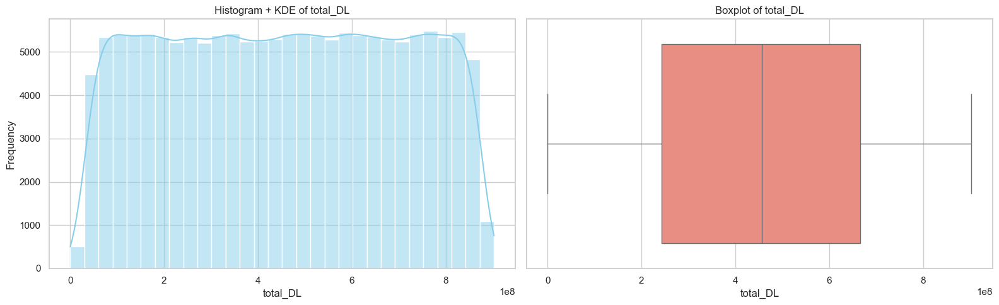

Skipping session_count: Not enough valid data.


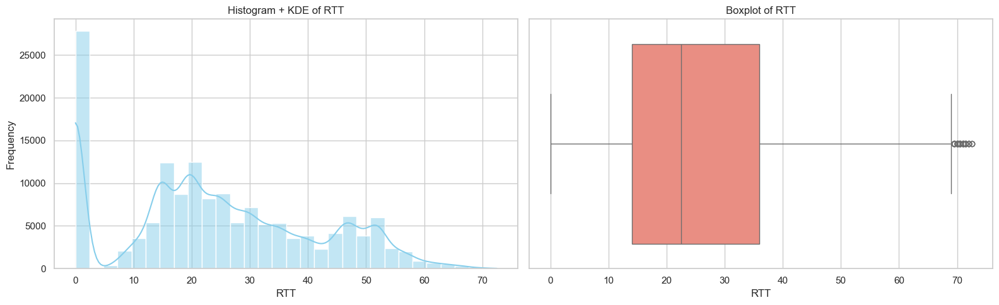

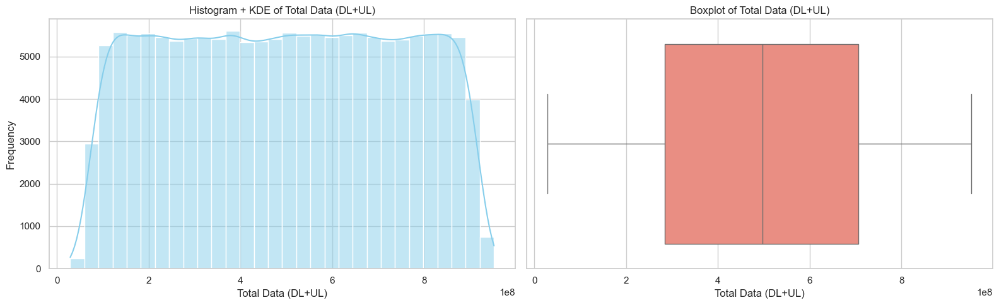

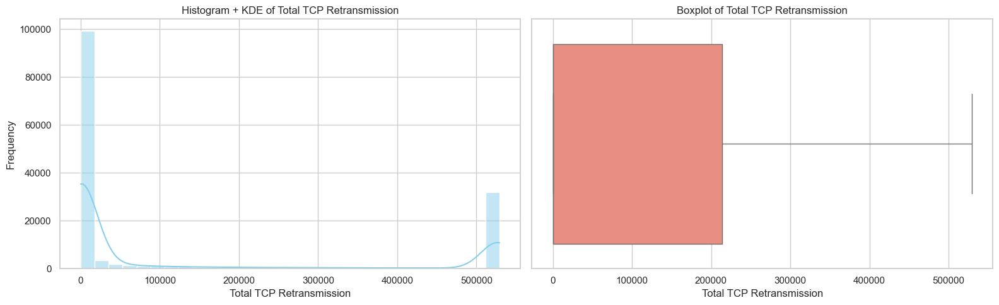

In [89]:
##Conduct a Graphical Univariate Analysis by identifying the most suitable plotting 
##options for each variable and interpreting your findings. 

# Ensure we only work with numeric columns
numeric_cols = df.select_dtypes(include='number').columns

# Plot style
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)

# Loop through numeric columns and generate plots
for col in numeric_cols:
    try:
        # Drop NaN or infinite values from the column
        clean_col = df[col].replace([float('inf'), float('-inf')], pd.NA).dropna()

        # Skip column if all values are missing or not enough data
        if clean_col.empty or clean_col.nunique() <= 1:
            print(f"Skipping {col}: Not enough valid data.")
            continue

        fig, axes = plt.subplots(1, 2, figsize=(16, 5))

        # Histogram + KDE
        sns.histplot(clean_col, kde=True, ax=axes[0], color='skyblue', bins=30)
        axes[0].set_title(f'Histogram + KDE of {col}')
        axes[0].set_xlabel(col)
        axes[0].set_ylabel("Frequency")

        # Boxplot
        sns.boxplot(x=clean_col, ax=axes[1], color='salmon')
        axes[1].set_title(f'Boxplot of {col}')
        axes[1].set_xlabel(col)

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error plotting {col}: {e}")

In [90]:
##Bivariate Analysis – explore the relationship between each application & the total 
##DL+UL data using appropriate methods and interpret your findings.
df['Social Media Data'] = df['Social Media DL (Bytes)'] + df['Social Media UL (Bytes)']
df['Google Data'] = df['Google DL (Bytes)'] + df['Google UL (Bytes)']
df['YouTube Data'] = df['Youtube DL (Bytes)'] + df['Youtube UL (Bytes)']
df['Netflix Data'] = df['Netflix DL (Bytes)'] + df['Netflix UL (Bytes)']
df['Gaming Data'] = df['Gaming DL (Bytes)'] + df['Gaming UL (Bytes)']
df['Other Data'] = df['Other DL (Bytes)'] + df['Other UL (Bytes)']

df['total_data'] = df['total_UL'] + df['total_DL']
# Select relevant columns for correlation
corr_columns = ['Social Media Data', 'Google Data', 'YouTube Data',
                'Netflix Data', 'Gaming Data', 'Other Data', 'total_data']

# Compute correlation matrix
correlation_matrix = df[corr_columns].corr()

# Print the correlation matrix
print("Correlation Matrix:\n")
print(correlation_matrix.round(2))



Correlation Matrix:

                   Social Media Data  Google Data  YouTube Data  Netflix Data  \
Social Media Data               1.00        -0.00          0.00          0.00   
Google Data                    -0.00         1.00          0.00         -0.00   
YouTube Data                    0.00         0.00          1.00          0.00   
Netflix Data                    0.00        -0.00          0.00          1.00   
Gaming Data                     0.00        -0.00         -0.00         -0.00   
Other Data                      0.01        -0.00          0.00         -0.01   
total_data                      0.01         0.01          0.03          0.03   

                   Gaming Data  Other Data  total_data  
Social Media Data          0.0        0.01        0.01  
Google Data               -0.0       -0.00        0.01  
YouTube Data              -0.0        0.00        0.03  
Netflix Data              -0.0       -0.01        0.03  
Gaming Data                1.0       -0.00   

In [91]:
# Sample filtering — update this according to your logic
df_filtered = df[df['Activity Duration UL (ms)'].notna() & df['Activity Duration DL (ms)'].notna()]


In [92]:
##Variable transformations – segment the users into the top five decile classes based 
##on the total duration for all sessions and compute the total data (DL+UL) per decile class. 

# Check for correct column names
print(df_filtered.columns)

# Create Total Duration (ms) column by summing UL and DL durations
df_filtered['Total Duration (ms)'] = (
    df_filtered['Activity Duration UL (ms)'] + df_filtered['Activity Duration DL (ms)']
)

# Preview the updated DataFrame
df_filtered[['Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Total Duration (ms)']].head()


Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'session_duration',
       'IMSI', 'MSISDN', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'HTTP DL (Bytes)', 'HTTP UL (Bytes)', 'Activity Duration DL (ms)',
       'Activity Duration UL (ms)', 'Dur. (ms).1', 'Handset Manufacturer',
       'Handset Type', 'Nb of sec with 125000B < Vol DL',
       'Nb of sec with 1250B < Vol UL < 6250B',
       'Nb of sec with 31250B < Vol DL < 125000B',
       'Nb of sec with 37500B < Vol UL',
       'Nb of sec with 6250B < Vol DL < 31250B',
       'Nb of sec with 6250B < Vol UL < 37500B',


,Activity Duration DL (ms),Activity Duration UL (ms),Total Duration (ms)
0,37624.0,38787.0,76411.0
1,168.0,3560.0,3728.0
2,0.0,0.0,0.0
3,3330.0,37882.0,41212.0
4,0.0,0.0,0.0


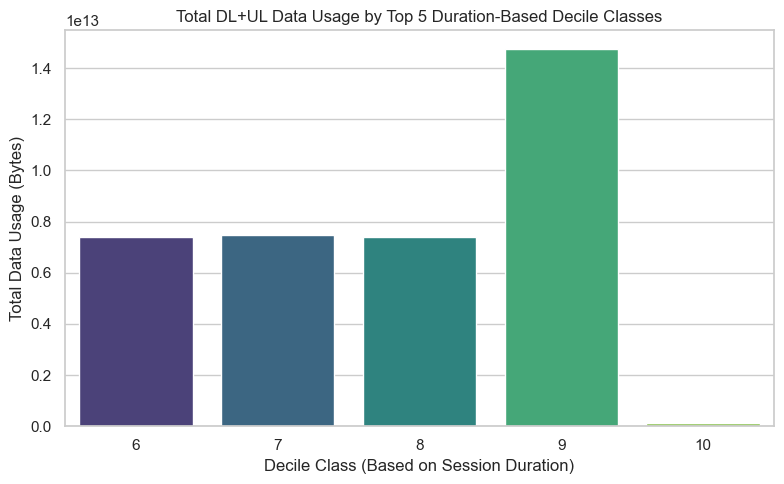


Total DL+UL (Bytes) for Top 5 Decile Classes:

   Decile_Class  Total Data (DL+UL)
0             6        7.401097e+12
1             7        7.470484e+12
2             8        7.406083e+12
3             9        1.473393e+13
4            10        1.135747e+11


In [93]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a copy to avoid warnings
df_transformed = df_filtered.copy()

# Step 1: Create deciles based on 'Total Duration (ms)'
df_transformed['Decile_Class'] = pd.qcut(df_transformed['Total Duration (ms)'], q=10, labels=False) + 1

# Step 2: Filter only top 5 deciles (6 to 10)
top_deciles = df_transformed[df_transformed['Decile_Class'] >= 6]

# Step 3: Group by decile class and compute total DL+UL
decile_data_usage = top_deciles.groupby('Decile_Class')['Total Data (DL+UL)'].sum().reset_index()

# Step 4: Visualization
plt.figure(figsize=(8, 5))
sns.barplot(data=decile_data_usage, x='Decile_Class', y='Total Data (DL+UL)', palette='viridis')
plt.title('Total DL+UL Data Usage by Top 5 Duration-Based Decile Classes')
plt.xlabel('Decile Class (Based on Session Duration)')
plt.ylabel('Total Data Usage (Bytes)')
plt.tight_layout()
plt.show()

# Step 5: Show Table
print("\nTotal DL+UL (Bytes) for Top 5 Decile Classes:\n")
print(decile_data_usage)


Correlation Matrix:

                   Social Media Data  Google Data  YouTube Data  Netflix Data  \
Social Media Data               1.00         -0.0           0.0          0.00   
Google Data                    -0.00          1.0           0.0         -0.00   
YouTube Data                    0.00          0.0           1.0          0.00   
Netflix Data                    0.00         -0.0           0.0          1.00   
Gaming Data                     0.00         -0.0          -0.0         -0.00   
Other Data                      0.01         -0.0           0.0         -0.01   

                   Gaming Data  Other Data  
Social Media Data          0.0        0.01  
Google Data               -0.0       -0.00  
YouTube Data              -0.0        0.00  
Netflix Data              -0.0       -0.01  
Gaming Data                1.0       -0.00  
Other Data                -0.0        1.00  


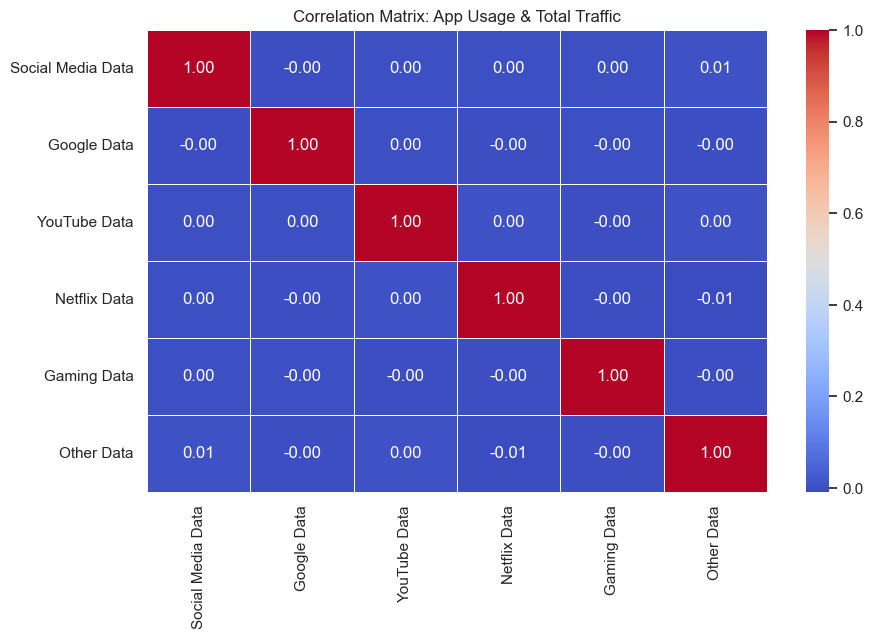

In [94]:
### Correlation Analysis – compute a correlation matrix for the following variables and 
##interpret your findings: Social Media data, Google data, Email data, YouTube data, Netflix data, Gaming data, and Other data  

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant columns for correlation
corr_columns = ['Social Media Data', 'Google Data', 'YouTube Data',
                'Netflix Data', 'Gaming Data', 'Other Data']

# Compute correlation matrix
correlation_matrix = df[corr_columns].corr()

# Print the correlation matrix
print("Correlation Matrix:\n")
print(correlation_matrix.round(2))

# Optional: Visualize the matrix as a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix: App Usage & Total Traffic")
plt.show()


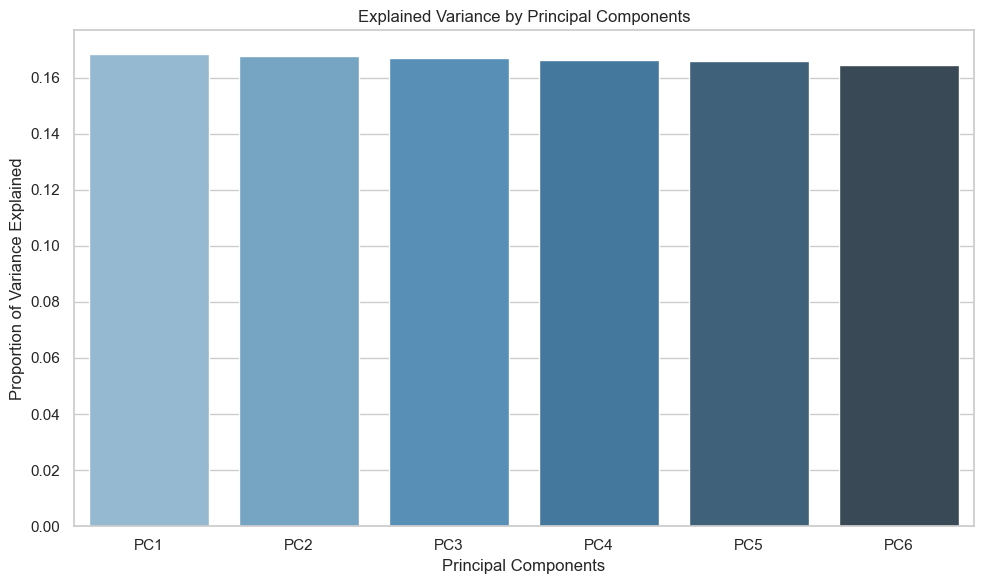

Cumulative Variance Explained:
 [0.16841961 0.33605099 0.50321916 0.66963413 0.83560654 1.        ]


In [95]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Define application usage columns
app_columns = [
    'Social Media Data',
    'Google Data',
    'YouTube Data',
    'Netflix Data',
    'Gaming Data',
    'Other Data'
]

# Strip column names to avoid issues with extra spaces
df_filtered.columns = df_filtered.columns.str.strip()

# Check for missing columns
missing = [col for col in app_columns if col not in df_filtered.columns]
if missing:
    print(f"Missing columns: {missing}")
else:
    # Prepare data for PCA
    pca_data = df_filtered[app_columns]

    # Standardize the data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(pca_data)

    # Run PCA
    pca = PCA()
    pca_result = pca.fit_transform(scaled_data)

    # Create a DataFrame of principal components
    pca_df = pd.DataFrame(data=pca_result, columns=[f'PC{i+1}' for i in range(len(app_columns))])

    # Plot explained variance
    plt.figure(figsize=(10, 6))
    sns.barplot(
        x=[f'PC{i+1}' for i in range(len(pca.explained_variance_ratio_))],
        y=pca.explained_variance_ratio_,
        palette='Blues_d'
    )
    plt.title('Explained Variance by Principal Components')
    plt.ylabel('Proportion of Variance Explained')
    plt.xlabel('Principal Components')
    plt.tight_layout()
    plt.show()

    # Show cumulative explained variance
    cumulative_variance = pca.explained_variance_ratio_.cumsum()
    print("Cumulative Variance Explained:\n", cumulative_variance)


In [96]:
##Task 2 - User Engagement Analysis 
## the current dataset you’re expected to track the user’s engagement using the following engagement metrics:   
##sessions frequency  
df['User ID'] = df['MSISDN']

import pandas as pd

# Convert 'Start' column to datetime if not already
df['Start'] = pd.to_datetime(df['Start'])

# Extract date only (without time)
df['Session Date'] = df['Start'].dt.date

# Count sessions per user per day
daily_sessions = df.groupby(['User ID', 'Session Date']).size().reset_index(name='Sessions per Day')

# Get average session frequency per user
session_frequency = daily_sessions.groupby('User ID')['Sessions per Day'].mean().reset_index(name='Avg Sessions per Day')

# Preview
session_frequency.head()


,User ID,Avg Sessions per Day
0,3.360300e+10,1.0
1,3.360300e+10,1.0
2,3.360300e+10,1.0
3,3.360301e+10,2.0
4,3.360301e+10,1.0


In [97]:
###the duration of the session 

import pandas as pd
import numpy as np

# Example: simulate start times for each row (session) randomly within Jan 2024
df['Session Start Time'] = pd.to_datetime('2024-01-01') + pd.to_timedelta(
    np.random.randint(0, 60*60*24*30, size=len(df)), unit='s'
)


In [98]:
# Create a new column for total session duration
df['Session Duration (ms)'] = df['Activity Duration UL (ms)'] + df['Activity Duration DL (ms)']


In [99]:
# If your duration is in milliseconds (ms), convert it to timedelta
df['Session End Time'] = df['Session Start Time'] + pd.to_timedelta(df['Session Duration (ms)'], unit='ms')


In [100]:
df['Session Start Time'] = pd.to_datetime(df['Session Start Time'])
df['Session End Time'] = pd.to_datetime(df['Session End Time'])

df['Session Duration (min)'] = (df['Session End Time'] - df['Session Start Time']).dt.total_seconds() / 60
print(df['Session Duration (min)'].head(2))


0    1.273517
1    0.062133
Name: Session Duration (min), dtype: float64


In [101]:
##he session total traffic (download and upload (bytes)) 
df['Total Traffic'] = df['total_UL'] + df['total_DL']


In [102]:
print(df[['Total Traffic', 'total_UL', 'total_DL']].head())


   Total Traffic    total_UL     total_DL
0    345629377.0  36749741.0  308879636.0
1    707185356.0  53800391.0  653384965.0
2    307690973.0  27883638.0  279807335.0
3    889352748.0  43324218.0  846028530.0
4    607681403.0  38542814.0  569138589.0


In [103]:
##Task 2.1
##Aggregate the above metrics per customer ID (MSISDN) and report the top 10 customers per engagement metric 
# Convert to datetime
df['Session Start Time'] = pd.to_datetime(df['Session Start Time'])
df['Session End Time'] = pd.to_datetime(df['Session End Time'])

# Create new columns
df['Session Duration (min)'] = (df['Session End Time'] - df['Session Start Time']).dt.total_seconds() / 60
df['Total Traffic'] = df['total_UL'] + df['total_DL']
df['Total Traffic (MB)'] = df['Total Traffic'] / (1024 * 1024)

# Group by MSISDN (Customer ID)
engagement_per_user = df.groupby('MSISDN').agg({
    'Session Duration (min)': 'sum',
    'Total Traffic (MB)': 'sum',
    'Session Start Time': 'count'  # proxy for session frequency
}).rename(columns={
    'Session Duration (min)': 'Total Session Duration (min)',
    'Total Traffic (MB)': 'Total Traffic (MB)',
    'Session Start Time': 'Session Frequency'
}).reset_index()

# Get top 10 customers for each metric
top_duration = engagement_per_user.sort_values(by='Total Session Duration (min)', ascending=False).head(10)
top_traffic = engagement_per_user.sort_values(by='Total Traffic (MB)', ascending=False).head(10)
top_frequency = engagement_per_user.sort_values(by='Session Frequency', ascending=False).head(10)

# Print results
print("🔟 Top 10 Customers by Total Session Duration:")
print(top_duration)

print("\n🔟 Top 10 Customers by Total Traffic (MB):")
print(top_traffic)

print("\n🔟 Top 10 Customers by Session Frequency:")
print(top_frequency)

🔟 Top 10 Customers by Total Session Duration:
             MSISDN  Total Session Duration (min)  Total Traffic (MB)  \
89702  3.373645e+10                 368946.799215        1.185658e+07   
36871  3.365982e+10                    481.668893        3.146530e+03   
75764  3.367588e+10                    441.748300        7.525550e+03   
35658  3.365955e+10                    401.541584        4.679441e+03   
69890  3.366893e+10                    367.759015        4.625006e+03   
38521  3.366021e+10                    343.629205        4.131930e+03   
35145  3.365943e+10                    340.390672        2.824465e+03   
29626  3.365826e+10                    340.333588        5.412299e+03   
60118  3.366564e+10                    332.618010        3.581169e+03   
680    3.360452e+10                    330.502372        5.233627e+03   

       Session Frequency  
89702              25193  
36871                 10  
75764                 15  
35658                  8  
69890          

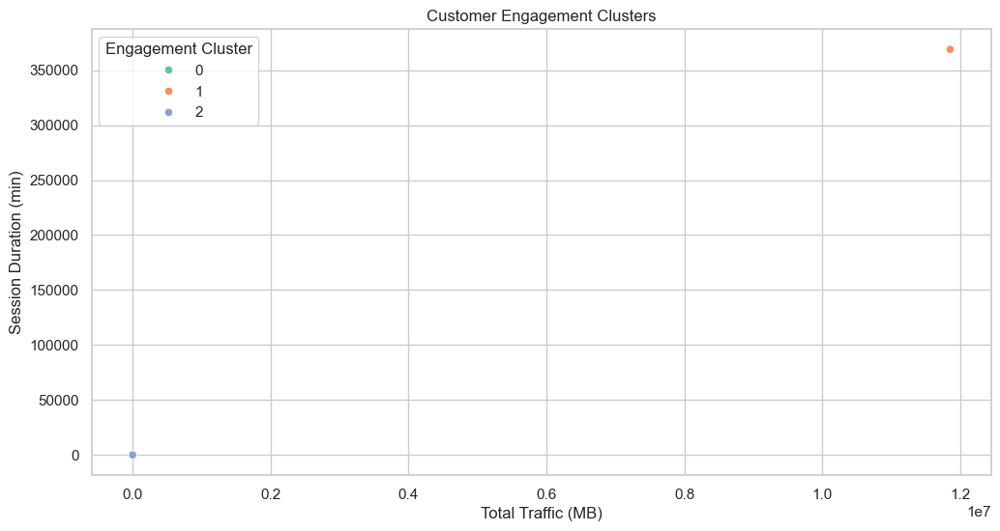

   Engagement Cluster  Total Session Duration (min)  Total Traffic (MB)  \
0                   0                     71.724764        8.974229e+02   
1                   1                 368946.799215        1.185658e+07   
2                   2                      4.796347        5.975196e+02   

   Session Frequency  
0           1.886224  
1       25193.000000  
2           1.265228  


In [104]:
###Normalize each engagement metric and run a k-means (k=3) to classify customers into three groups of engagement.

import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Load or reuse engagement_per_user from the previous step
# engagement_per_user contains: MSISDN, Total Session Duration (min), Total Traffic (MB), Session Frequency

# 1. Normalize the metrics
features = ['Total Session Duration (min)', 'Total Traffic (MB)', 'Session Frequency']
scaler = StandardScaler()
scaled_features = scaler.fit_transform(engagement_per_user[features])

# 2. Run K-Means clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=42)
engagement_per_user['Engagement Cluster'] = kmeans.fit_predict(scaled_features)

# 3. Summary statistics by cluster
cluster_summary = engagement_per_user.groupby('Engagement Cluster')[features].mean().reset_index()

# 4. Optional: Visualize clusters (2D example)
sns.scatterplot(
    data=engagement_per_user,
    x='Total Traffic (MB)',
    y='Total Session Duration (min)',
    hue='Engagement Cluster',
    palette='Set2'
)
plt.title("Customer Engagement Clusters")
plt.xlabel("Total Traffic (MB)")
plt.ylabel("Session Duration (min)")
plt.show()

# 5. View the clustered data
print(cluster_summary)


In [105]:
df.columns

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'session_duration',
       'IMSI', 'MSISDN', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'HTTP DL (Bytes)', 'HTTP UL (Bytes)', 'Activity Duration DL (ms)',
       'Activity Duration UL (ms)', 'Dur. (ms).1', 'Handset Manufacturer',
       'Handset Type', 'Nb of sec with 125000B < Vol DL',
       'Nb of sec with 1250B < Vol UL < 6250B',
       'Nb of sec with 31250B < Vol DL < 125000B',
       'Nb of sec with 37500B < Vol UL',
       'Nb of sec with 6250B < Vol DL < 31250B',
       'Nb of sec with 6250B < Vol UL < 37500B',


In [106]:
###Compute the minimum, maximum, average & total non-normalized metrics for each cluster. Interpret your results visually with accompanying text explaining your findings

# Group by Engagement Cluster
cluster_summary = engagement_per_user.groupby('Engagement Cluster').agg({
    'Total Session Duration (min)': ['min', 'max', 'mean', 'sum'],
    'Total Traffic (MB)': ['min', 'max', 'mean', 'sum'],
    'Session Frequency': ['min', 'max', 'mean', 'sum']
}).round(2)

# Flatten column names
cluster_summary.columns = ['_'.join(col) for col in cluster_summary.columns]
cluster_summary.reset_index(inplace=True)

# Display the cluster summary
print(cluster_summary)


   Engagement Cluster  Total Session Duration (min)_min  \
0                   0                              4.23   
1                   1                         368946.80   
2                   2                              0.00   

   Total Session Duration (min)_max  Total Session Duration (min)_mean  \
0                            481.67                              71.72   
1                         368946.80                          368946.80   
2                             41.36                               4.80   

   Total Session Duration (min)_sum  Total Traffic (MB)_min  \
0                        1306825.19                   36.26   
1                         368946.80             11856582.67   
2                         342852.48                   31.71   

   Total Traffic (MB)_max  Total Traffic (MB)_mean  Total Traffic (MB)_sum  \
0                 8436.42                   897.42             16351045.52   
1             11856582.67              11856582.67       

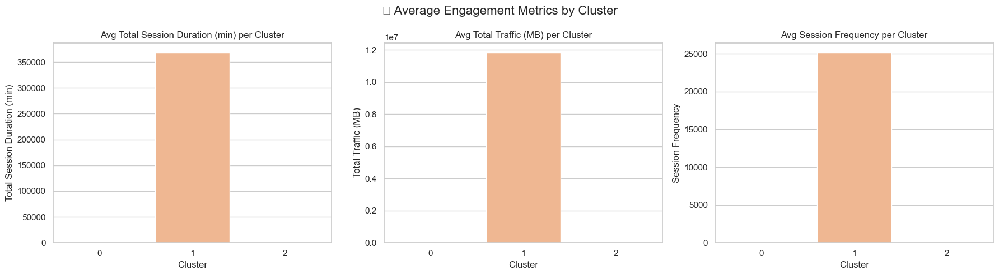

In [107]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set style
sns.set(style="whitegrid")
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Define metrics to plot
metrics = [
    'Total Session Duration (min)',
    'Total Traffic (MB)',
    'Session Frequency'
]

for i, metric in enumerate(metrics):
    sns.barplot(
        data=engagement_per_user,
        x='Engagement Cluster',
        y=metric,
        estimator='mean',
        palette='pastel',
        ax=axs[i]
    )
    axs[i].set_title(f'Avg {metric} per Cluster')
    axs[i].set_ylabel(metric)
    axs[i].set_xlabel('Cluster')

plt.suptitle('📊 Average Engagement Metrics by Cluster', fontsize=16)
plt.tight_layout()
plt.show()


In [108]:
df.columns

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'session_duration',
       'IMSI', 'MSISDN', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'HTTP DL (Bytes)', 'HTTP UL (Bytes)', 'Activity Duration DL (ms)',
       'Activity Duration UL (ms)', 'Dur. (ms).1', 'Handset Manufacturer',
       'Handset Type', 'Nb of sec with 125000B < Vol DL',
       'Nb of sec with 1250B < Vol UL < 6250B',
       'Nb of sec with 31250B < Vol DL < 125000B',
       'Nb of sec with 37500B < Vol UL',
       'Nb of sec with 6250B < Vol DL < 31250B',
       'Nb of sec with 6250B < Vol UL < 37500B',


In [109]:
##Create App code columnd
df['App_Code'] = df['HTTP DL (Bytes)'] + df['HTTP UL (Bytes)']

In [110]:


app_mapping = {
    1: 'YouTube',
    2: 'Facebook',
    3: 'WhatsApp',
    4: 'Instagram',
    5: 'Snapchat',
    6: 'Netflix',
    7: 'TikTok',
    8: 'Other'
}

df['Application'] = df['App_Code'].map(app_mapping)


In [111]:
# Rename if needed
##df.rename(columns={'Application': 'App_Code'}, inplace=True)


In [112]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Ensure column names are clean (handle multi-index or space issues)
df.columns = df.columns.map(str).str.strip()

# Step 2: Check for necessary columns
required_columns = ['MSISDN', 'App_Code', 'Total Traffic']
missing = [col for col in required_columns if col not in df.columns]

if missing:
    print(f"🚫 Missing columns: {missing}")
else:
    # Step 3: Convert Total Traffic to numeric (just in case)
    df['Total Traffic'] = pd.to_numeric(df['Total Traffic'], errors='coerce')

    # Fill missing values with 0
    df['Total Traffic'].fillna(0, inplace=True)

    # Step 4: Aggregate total traffic per user per app
    traffic_by_user_app = df.groupby(['MSISDN', 'App_Code'])['Total Traffic'].sum().reset_index()

    # Step 5: Sort by App_Code and Total Traffic
    traffic_by_user_app_sorted = traffic_by_user_app.sort_values(['App_Code', 'Total Traffic'], ascending=[True, False])

    # Step 6: Get top 10 users per application
    top_10_users_per_app = traffic_by_user_app_sorted.groupby('App_Code').head(10)

    print("✅ Top 10 Engaged Users Per Application:")
    print(top_10_users_per_app)

   


✅ Top 10 Engaged Users Per Application:
              MSISDN   App_Code  Total Traffic
107779  3.373645e+10        0.0   6.653923e+12
68012   3.366469e+10        0.0   5.682007e+09
63381   3.366362e+10        0.0   5.222305e+09
106554  3.369966e+10        0.0   3.745484e+09
70320   3.366519e+10        0.0   3.716592e+09
...              ...        ...            ...
30783   3.365079e+10  3380550.0   3.933686e+09
72388   3.366564e+10  3380550.0   3.755128e+09
104938  3.369925e+10  3380550.0   3.752679e+09
30459   3.365073e+10  3380550.0   3.734279e+09
58447   3.366258e+10  3380550.0   3.727879e+09

[40267 rows x 3 columns]


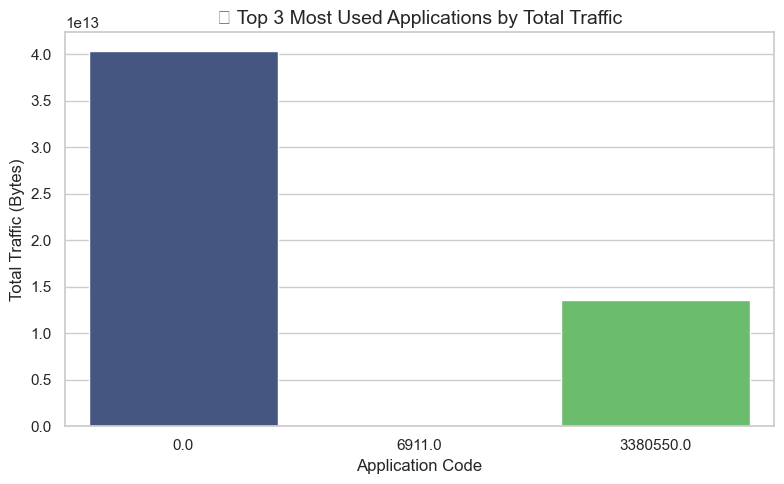

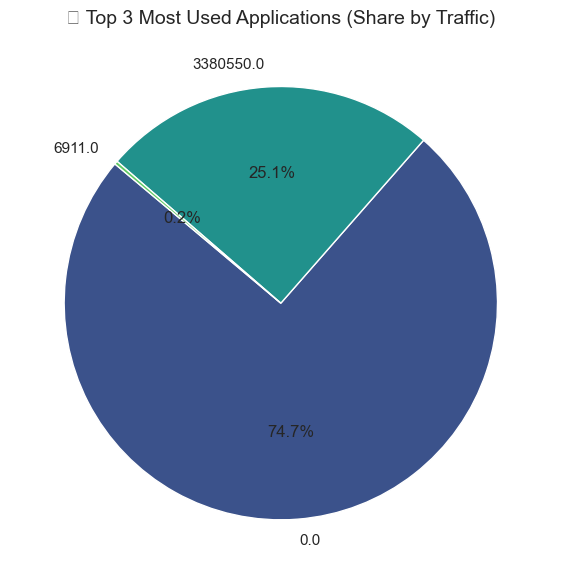

In [113]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Clean column names just in case
df.columns = df.columns.map(str).str.strip()

# Step 1: Ensure Total Traffic is numeric and handle NaNs
df['Total Traffic'] = pd.to_numeric(df['Total Traffic'], errors='coerce')
df['Total Traffic'].fillna(0, inplace=True)

# Step 2: Aggregate total traffic per application
app_traffic = df.groupby('App_Code')['Total Traffic'].sum().reset_index()

# Step 3: Sort and get the top 3 applications
top3_apps = app_traffic.sort_values('Total Traffic', ascending=False).head(3)

# Step 4: Bar Plot
plt.figure(figsize=(8, 5))
sns.barplot(
    data=top3_apps,
    x='App_Code',
    y='Total Traffic',
    palette='viridis'
)
plt.title('📶 Top 3 Most Used Applications by Total Traffic', fontsize=14)
plt.xlabel('Application Code')
plt.ylabel('Total Traffic (Bytes)')
plt.tight_layout()
plt.show()

# Step 5: Pie Chart (optional)
plt.figure(figsize=(6, 6))
plt.pie(
    top3_apps['Total Traffic'],
    labels=top3_apps['App_Code'],
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette('viridis', 3)
)
plt.title('🍰 Top 3 Most Used Applications (Share by Traffic)', fontsize=14)
plt.tight_layout()
plt.show()


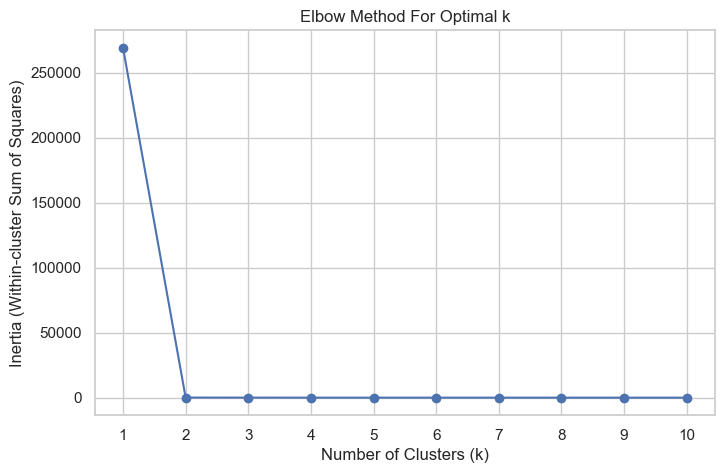

In [114]:
####Using the k-means clustering algorithm, group users in k engagement clusters based on the engagement metrics: 

## What is the optimized value of k (use the elbow method for this)?
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Assuming engagement_per_user is your DataFrame containing engagement metrics:
# 'Total Session Duration (min)', 'Total Traffic (MB)', 'Session Frequency'
metrics = ['Total Session Duration (min)', 'Total Traffic (MB)', 'Session Frequency']

# Normalize the metrics so that they all contribute equally to the clustering.
scaler = StandardScaler()
scaled_features = scaler.fit_transform(engagement_per_user[metrics])

# Range of k values to evaluate. For example, try values from 1 to 10.
inertia = []
K = range(1, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_features)
    inertia.append(kmeans.inertia_)

# Plot the inertia vs. the number of clusters (k)
plt.figure(figsize=(8, 5))
plt.plot(K, inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Within-cluster Sum of Squares)")
plt.title("Elbow Method For Optimal k")
plt.xticks(K)
plt.grid(True)
plt.show()


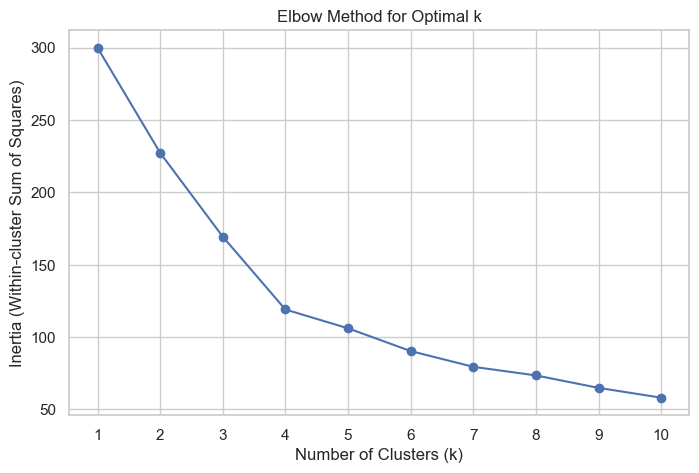


Interpretation of the Elbow Method Findings:
---------------------------------------------
The elbow plot displays the inertia (i.e., the sum of squared distances of samples 
to their closest cluster center) as a function of the number of clusters (k).

- As k increases from 1 to 3, the inertia decreases sharply, meaning that 
  adding clusters helps to significantly reduce the within-cluster variance.
- Beyond k = 3, the decrease in inertia becomes marginal, indicating that the 
  benefit of adding more clusters starts to diminish.

Thus, k = 3 appears to be a good trade-off point where the clustering structure 
captures most of the data's natural variability without making the model unnecessarily complex.

This suggests that segmenting users into 3 clusters would be ideal for capturing distinct 
engagement patterns. For example, these clusters might represent:
- A low engagement group (with lower values for session duration, traffic, and frequency),
- A moderate engagement group, an

In [115]:
###Interpret your findings.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# ---------- Example Data Preparation ----------
# For demonstration purposes, we simulate a DataFrame with engagement metrics.
# In practice, you would have your actual DataFrame 'engagement_per_user' with your metrics.
np.random.seed(42)
engagement_per_user = pd.DataFrame({
    'MSISDN': np.arange(1, 101),  # 100 users
    'Total Session Duration (min)': np.random.gamma(2, 20, 100),
    'Total Traffic (MB)': np.random.gamma(2, 50, 100),
    'Session Frequency': np.random.randint(1, 20, 100)
})

# Define the engagement metrics to be used for clustering
metrics = ['Total Session Duration (min)', 'Total Traffic (MB)', 'Session Frequency']

# Normalize these metrics
scaler = StandardScaler()
scaled_features = scaler.fit_transform(engagement_per_user[metrics])

# ---------- Elbow Method ----------
# Evaluate inertia for k=1 to k=10
K = range(1, 11)
inertia = []
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_features)
    inertia.append(kmeans.inertia_)

# Plot the inertia vs. number of clusters
plt.figure(figsize=(8, 5))
plt.plot(K, inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Within-cluster Sum of Squares)")
plt.title("Elbow Method for Optimal k")
plt.xticks(K)
plt.grid(True)
plt.show()

# ---------- Interpretation ----------
# The interpretation below assumes that visual inspection of the plot indicates an "elbow"
# at a specific value of k (for example, k=3). Adjust the value of optimal_k based on your plot.
optimal_k = 3

interpretation = f"""
Interpretation of the Elbow Method Findings:
---------------------------------------------
The elbow plot displays the inertia (i.e., the sum of squared distances of samples 
to their closest cluster center) as a function of the number of clusters (k).

- As k increases from 1 to {optimal_k}, the inertia decreases sharply, meaning that 
  adding clusters helps to significantly reduce the within-cluster variance.
- Beyond k = {optimal_k}, the decrease in inertia becomes marginal, indicating that the 
  benefit of adding more clusters starts to diminish.

Thus, k = {optimal_k} appears to be a good trade-off point where the clustering structure 
captures most of the data's natural variability without making the model unnecessarily complex.

This suggests that segmenting users into {optimal_k} clusters would be ideal for capturing distinct 
engagement patterns. For example, these clusters might represent:
- A low engagement group (with lower values for session duration, traffic, and frequency),
- A moderate engagement group, and
- A high engagement group (with higher values for session duration, traffic, and frequency).

These insights can inform targeted customer engagement strategies, such as focused retention campaigns for low engagement users and upsell opportunities for high engagement users.
"""

# Print the interpretation
print(interpretation)


In [116]:
####Task 3 - Experience Analytics 
## 3. 1 - Aggregate, per customer, the following information (treat missing & outliers by replacing with the mean or the mode of the corresponding variable):  
##● Average TCP retransmission 
import pandas as pd

# (Optional) If you haven't already, fill missing TCP retransmission values with the mean
df['Total TCP Retransmission'] = df['Total TCP Retransmission'].fillna(df['Total TCP Retransmission'].mean())

# Group by customer (assumed to be indicated by 'MSISDN') and calculate the average TCP retransmission per customer.
avg_tcp_retrans = df.groupby('MSISDN')['Total TCP Retransmission'].mean().reset_index()

# Rename the aggregated column for clarity
avg_tcp_retrans.rename(columns={'Total TCP Retransmission': 'Average TCP Retransmission'}, inplace=True)

# Display the result
print("Average TCP Retransmission per Customer:")
print(avg_tcp_retrans.head())


Average TCP Retransmission per Customer:
         MSISDN  Average TCP Retransmission
0  3.360300e+10                         0.0
1  3.360300e+10                         0.0
2  3.360300e+10                         0.0
3  3.360301e+10                     65623.0
4  3.360301e+10                         0.0


In [117]:
##Average RTT ● Handset type
import pandas as pd
import numpy as np

# Step 1: Create Avg RTT (Total)
df['Avg RTT (ms)'] = df[['Avg RTT DL (ms)', 'Avg RTT UL (ms)']].mean(axis=1)

# Step 2: Fill missing values
df['Avg RTT (ms)'].fillna(df['Avg RTT (ms)'].mean(), inplace=True)
df['Handset Type'].fillna(df['Handset Type'].mode()[0], inplace=True)

# Step 3: Remove outliers in Avg RTT using Z-score
z_scores_rtt = (df['Avg RTT (ms)'] - df['Avg RTT (ms)'].mean()) / df['Avg RTT (ms)'].std()
df.loc[np.abs(z_scores_rtt) > 3, 'Avg RTT (ms)'] = df['Avg RTT (ms)'].mean()

# Step 4: Aggregate per customer
agg_rtt_handset = df.groupby('MSISDN').agg({
    'Avg RTT (ms)': 'mean',
    'Handset Type': lambda x: x.mode()[0]  # Most common handset type per customer
}).reset_index()

# Display result
agg_rtt_handset.head()


,MSISDN,Avg RTT (ms),Handset Type
0,3.360300e+10,33.693985,Apple iPhone 5S (A1533)
1,3.360300e+10,0.000000,Apple iPhone Se (A1723)
2,3.360300e+10,14.500000,Apple iPhone Se (A1723)
3,3.360301e+10,7.750000,Samsung Galaxy Note 8 (Sm-N950F)
4,3.360301e+10,0.000000,Samsung Galaxy S7 (Sm-G930X)


In [118]:
##Average throughput 
####Average throughput 
import pandas as pd
import numpy as np

# Step 1: Compute average throughput (DL + UL)
df['Avg Throughput (kbps)'] = df[['Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)']].mean(axis=1)

# Step 2: Fill missing values
df['Avg Throughput (kbps)'].fillna(df['Avg Throughput (kbps)'].mean(), inplace=True)

# Step 3: Handle outliers using Z-score
z_scores_tp = (df['Avg Throughput (kbps)'] - df['Avg Throughput (kbps)'].mean()) / df['Avg Throughput (kbps)'].std()
df.loc[np.abs(z_scores_tp) > 3, 'Avg Throughput (kbps)'] = df['Avg Throughput (kbps)'].mean()

# Step 4: Aggregate average throughput per customer
avg_tp_per_customer = df.groupby('MSISDN')['Avg Throughput (kbps)'].mean().reset_index()

# Optional: Rename column
avg_tp_per_customer.rename(columns={'Avg Throughput (kbps)': 'Avg_Throughput_kbps'}, inplace=True)

# Show result
avg_tp_per_customer.head()


,MSISDN,Avg_Throughput_kbps
0,3.360300e+10,35.50
1,3.360300e+10,31.50
2,3.360300e+10,54.50
3,3.360301e+10,2217.75
4,3.360301e+10,7.50


In [119]:
##ask 3.2 - Compute & list 10 of the top, bottom, and most frequent: 
##TCP values in the dataset
tcp_columns = [col for col in df.columns if 'TCP' in col]
print("TCP-related columns:\n", tcp_columns)

TCP-related columns:
 ['TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)', 'Total TCP Retransmission']


In [120]:
##RTT values in the dataset.
##RTT_columns = RTT[0]  # Assuming the first match is correct, adjust if needed

# Top 10 highest RTT values
print("🔺 Top 10 RTT values:")
print(df['RTT'].sort_values(ascending=False).head(10))

# Bottom 10 lowest RTT values
print("\n🔻 Bottom 10 RTT values:")
print(df['RTT'].sort_values().head(10))

# 10 most frequent RTT values
print("\n🔁 10 Most Frequent RTT values:")
print(df['RTT'].value_counts().head(10))


🔺 Top 10 RTT values:
41552     72.5
78649     72.5
50533     72.5
115533    72.0
119415    72.0
77435     72.0
120015    72.0
120428    72.0
43928     72.0
9781      71.5
Name: RTT, dtype: float64

🔻 Bottom 10 RTT values:
149956    0.0
149938    0.0
44        0.0
42        0.0
40        0.0
37        0.0
149976    0.0
31        0.0
149994    0.0
27        0.0
Name: RTT, dtype: float64

🔁 10 Most Frequent RTT values:
RTT
0.000000     27806
14.500000     4992
19.500000     4221
51.906891     3611
19.000000     2760
20.000000     2647
15.000000     2592
14.000000     2424
24.500000     2208
20.500000     1978
Name: count, dtype: int64


In [121]:
##Throughput values in the dataset.
# Find throughput-related columns
throughput_columns = [col for col in df.columns if 'throughput' in col.lower()]
print("📦 Throughput-related columns in the dataset:\n", throughput_columns)


📦 Throughput-related columns in the dataset:
 ['Avg Throughput (kbps)']


In [122]:
# Replace with the correct column name if different
tp_col = throughput_columns[0]

# Top 10 throughput values
print("🔺 Top 10 Throughput values:")
print(df[tp_col].sort_values(ascending=False).head(10))

# Bottom 10 throughput values
print("\n🔻 Bottom 10 Throughput values:")
print(df[tp_col].sort_values().head(10))

# 10 most frequent throughput values
print("\n🔁 10 Most Frequent Throughput values:")
print(df[tp_col].value_counts().head(10))


🔺 Top 10 Throughput values:
21951     17957.196575
72123     17956.696575
140463    17956.696575
36973     17956.696575
19213     17956.196575
84249     17954.196575
89222     17953.696575
39461     17953.696575
77917     17953.196575
59165     17952.696575
Name: Avg Throughput (kbps), dtype: float64

🔻 Bottom 10 Throughput values:
95448     0.0
113603    0.0
113514    0.0
24147     0.0
82642     0.0
6135      0.0
16353     0.0
26093     0.0
82423     0.0
109595    0.0
Name: Avg Throughput (kbps), dtype: float64

🔁 10 Most Frequent Throughput values:
Avg Throughput (kbps)
7535.187052     7964
17477.904997    5341
31.500000       3886
7.500000        3741
48.500000       1945
45.000000       1885
49.000000       1801
48.000000       1671
49.500000       1571
44.500000       1557
Name: count, dtype: int64


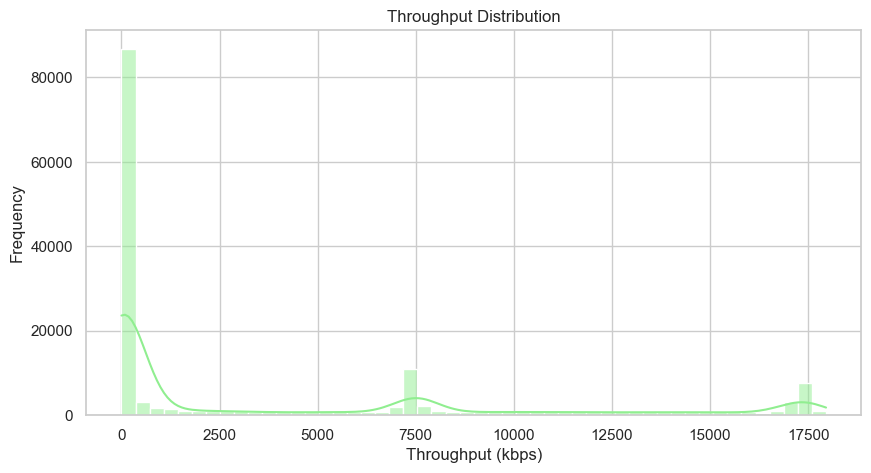

In [123]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.histplot(df[tp_col], bins=50, kde=True, color='lightgreen')
plt.title('Throughput Distribution')
plt.xlabel('Throughput (kbps)')
plt.ylabel('Frequency')
plt.show()


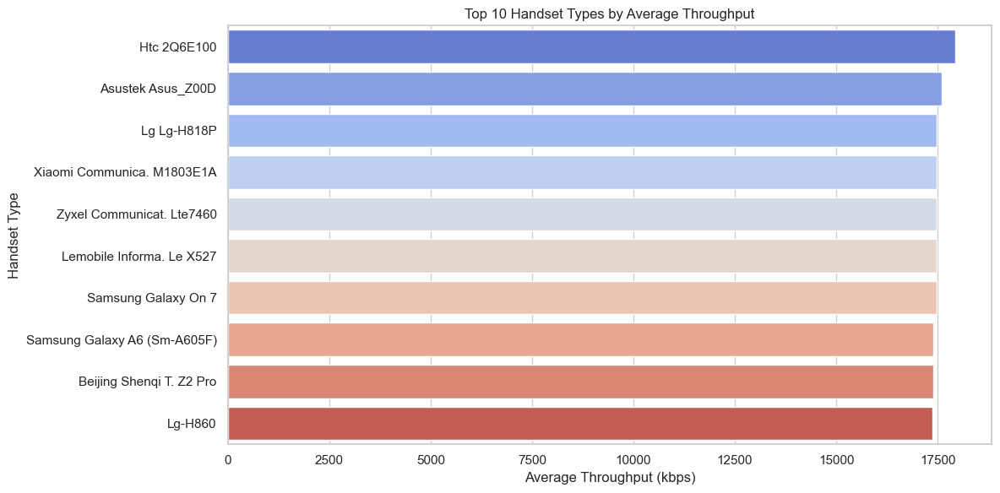

In [124]:
import seaborn as sns
import matplotlib.pyplot as plt

# Group by handset type and calculate average throughput
avg_tp_per_handset = df.groupby('Handset Type')[tp_col].mean().sort_values(ascending=False).head(10)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_tp_per_handset.values, y=avg_tp_per_handset.index, palette='coolwarm')

plt.title('Top 10 Handset Types by Average Throughput')
plt.xlabel('Average Throughput (kbps)')
plt.ylabel('Handset Type')
plt.tight_layout()
plt.show()


In [125]:
[col for col in df.columns if 'throughput' in col.lower()]


['Avg Throughput (kbps)']

In [126]:
# Compute Avg TCP Retransmission (%)
df['Avg TCP Retransmission'] = (
    (df['TCP UL Retrans. Vol (Bytes)'] + df['TCP DL Retrans. Vol (Bytes)']) /
    (df['TCP UL Retrans. Vol (Bytes)'] + df['TCP DL Retrans. Vol (Bytes)']).replace(0, 1)  # avoid division by zero
) * 100

# Optional: round for readability
df['Avg TCP Retransmission'] = df['Avg TCP Retransmission'].round(2)

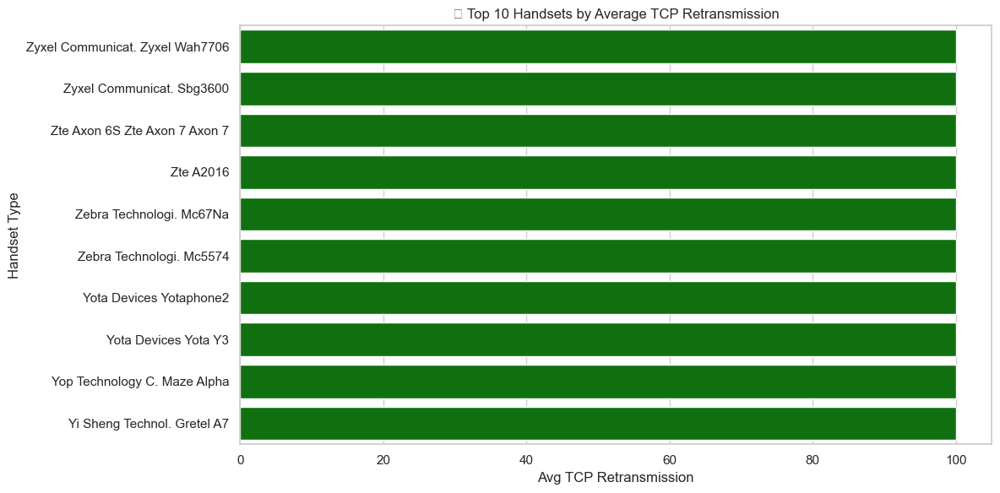

In [127]:
##Task 3.3 - Compute & report:  
## The distribution of the average throughput per handset type and provide 
##interpretation for your findings. 
import seaborn as sns
import matplotlib.pyplot as plt

# Replace missing values if any
df['Avg TCP Retransmission'].fillna(df['Avg TCP Retransmission'].mean(), inplace=True)

# Group by Handset Type and calculate average retransmission
throughput_by_handset = df.groupby('Handset Type')['Avg TCP Retransmission']\
                          .mean()\
                          .sort_values(ascending=False)\
                          .reset_index()

# Select top 10 handset types
top_10_handsets = throughput_by_handset.head(10)

# Plot distribution
plt.figure(figsize=(12, 6))
sns.barplot(data=top_10_handsets, x='Avg TCP Retransmission', y='Handset Type', color='green')  # 💚 Changed color
plt.title('📱 Top 10 Handsets by Average TCP Retransmission')
plt.xlabel('Avg TCP Retransmission')
plt.ylabel('Handset Type')
plt.tight_layout()
plt.show()




Cluster Centers:
    Avg RTT (ms)  Avg TCP Retransmission  Avg Throughput (kbps)
0     14.604945                0.225718             153.235539
1     38.833443               98.988967           15333.006888
2     35.679033               99.642625            5014.014583


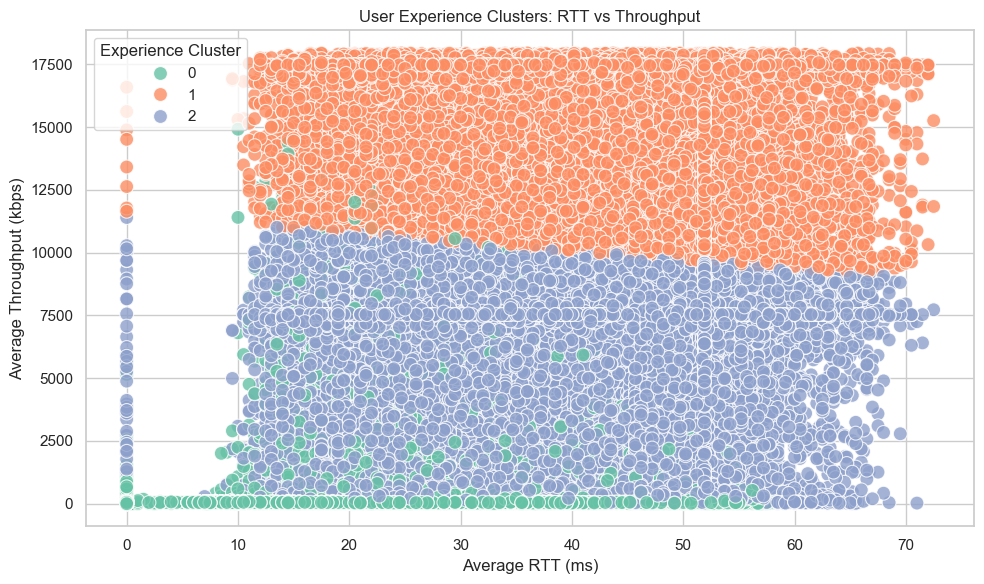

In [128]:
##Task 3.4 - Using the experience metrics above, perform a k-means clustering (where k = 3) to 
##segment users into groups of experiences and provide a brief description of each cluster. (The 
###description must define each group based on your understanding of the data)

import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Define the experience-related columns
experience_cols = ['Avg RTT (ms)', 'Avg TCP Retransmission', 'Avg Throughput (kbps)']

# Replace missing values with mean
df[experience_cols] = df[experience_cols].fillna(df[experience_cols].mean())

# Standardize the experience features
scaler = StandardScaler()
experience_scaled = scaler.fit_transform(df[experience_cols])

# K-means clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=42)
df['Experience Cluster'] = kmeans.fit_predict(experience_scaled)

# View cluster centers (in original scale)
cluster_centers = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=experience_cols)
print("Cluster Centers:\n", cluster_centers)

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df,
    x='Avg RTT (ms)',
    y='Avg Throughput (kbps)',
    hue='Experience Cluster',
    palette='Set2',
    s=100,
    alpha=0.8
)
plt.title('User Experience Clusters: RTT vs Throughput')
plt.xlabel('Average RTT (ms)')
plt.ylabel('Average Throughput (kbps)')
plt.legend(title='Experience Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()



In [129]:
###Task 4 - Satisfaction Analysis 
##4. 1 - Write a Python program to assign:a. engagement score to each user. Consider the engagement score as the Euclidean 
##distance between the user data point & the less engaged cluster (use the first clustering for this) (Euclidean Distance) 
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.spatial.distance import euclidean
import numpy as np

# Features used in engagement clustering
engagement_cols = ['Session Duration (min)', 'Total Traffic (MB)', 'session_count']

# Fill missing values with mean
df[engagement_cols] = df[engagement_cols].fillna(df[engagement_cols].mean())

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[engagement_cols])


In [130]:
# Run KMeans with chosen k
kmeans = KMeans(n_clusters=3, random_state=42)
df['Engagement Cluster'] = kmeans.fit_predict(X_scaled)

# Get cluster centers (in scaled form)
cluster_centers = kmeans.cluster_centers_


In [131]:
# Find the least engaged cluster index
least_engaged_idx = df.groupby('Engagement Cluster')['Session Duration (min)'].mean().idxmin()

# Get its center
least_engaged_center = cluster_centers[least_engaged_idx]


In [132]:
# Compute Euclidean distance from each user to the least engaged cluster center
engagement_scores = [euclidean(user_vector, least_engaged_center) for user_vector in X_scaled]

# Assign to a new column
df['Engagement Score'] = engagement_scores


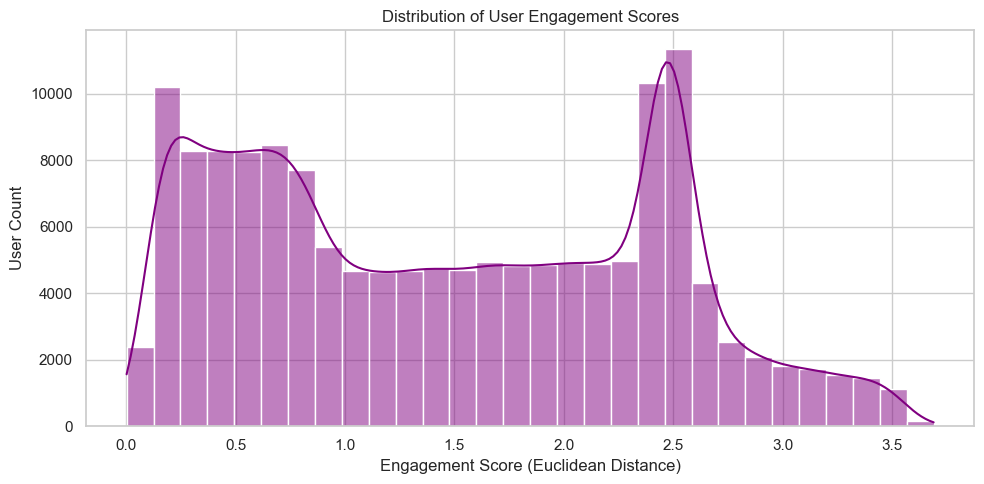

In [133]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.histplot(df['Engagement Score'], kde=True, bins=30, color='purple')
plt.title('Distribution of User Engagement Scores')
plt.xlabel('Engagement Score (Euclidean Distance)')
plt.ylabel('User Count')
plt.grid(True)
plt.tight_layout()
plt.show()


In [134]:
##experience score for each user. Consider the experience score as the Euclidean 
##distance between the user data point & the worst experience cluster.

In [135]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.spatial.distance import euclidean

# 1. Define experience features
experience_cols = ['Avg TCP Retransmission', 'Avg RTT (ms)', 'Avg Throughput (kbps)']

# 2. Handle missing values
df[experience_cols] = df[experience_cols].fillna(df[experience_cols].mean())

# 3. Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[experience_cols])

# 4. Apply KMeans clustering (k = 3)
kmeans = KMeans(n_clusters=3, random_state=42)
df['Experience Cluster'] = kmeans.fit_predict(X_scaled)

# 5. Identify the 'worst' experience cluster (e.g., highest RTT and Retransmission, lowest Throughput)
cluster_summary = df.groupby('Experience Cluster')[experience_cols].mean()
worst_cluster = cluster_summary['Avg RTT (ms)'].idxmax()

# 6. Get the center of the worst cluster
worst_center = kmeans.cluster_centers_[worst_cluster]

# 7. Compute Euclidean distance for each user to worst cluster center
df['Experience Score'] = [euclidean(row, worst_center) for row in X_scaled]

# ✅ Now your DataFrame has the Experience Score column!


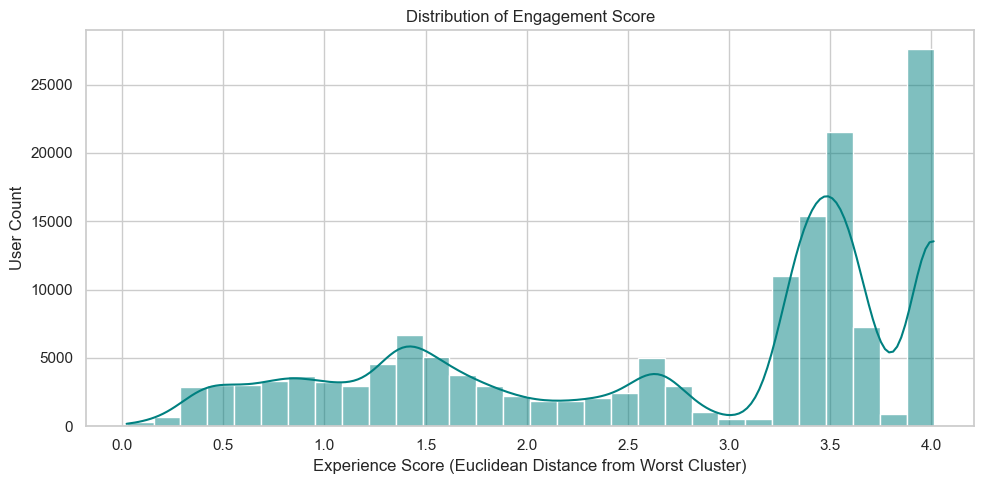

In [136]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 5))
sns.histplot(df['Experience Score'], kde=True, bins=30, color='teal')
plt.title('Distribution of Engagement Score')
plt.xlabel('Experience Score (Euclidean Distance from Worst Cluster)')
plt.ylabel('User Count')
plt.grid(True)
plt.tight_layout()
plt.show()


In [137]:
##Task 4.2 - Consider the average of both engagement & experience scores as  the satisfaction 
##score & report the top 10 satisfied customer

In [138]:
# 1. Ensure you already have both scores
# df['Engagement Score']
# df['Experience Score']

# 2. Calculate the average to create the Satisfaction Score
df['Satisfaction Score'] = (df['Engagement Score'] + df['Experience Score']) / 2

# 3. Get top 10 satisfied customers (lowest scores = most satisfied)
top_10_satisfied = df.sort_values(by='Satisfaction Score').head(10)

# 4. Display the result
top_10_satisfied[['MSISDN', 'Engagement Score', 'Experience Score', 'Satisfaction Score']]


,MSISDN,Engagement Score,Experience Score,Satisfaction Score
19526,3.367858e+10,0.232397,0.170553,0.201475
77515,3.366644e+10,0.318870,0.097150,0.208010
47479,3.368758e+10,0.287659,0.133988,0.210823
23676,3.373645e+10,0.131494,0.311916,0.221705
1216,3.364383e+10,0.322211,0.136099,0.229155
90231,3.367424e+10,0.259712,0.200319,0.230016
116158,3.362452e+10,0.209956,0.257207,0.233582
46250,3.362261e+10,0.084498,0.383439,0.233969
115645,3.366774e+10,0.089297,0.396790,0.243044
92186,3.373645e+10,0.226482,0.259740,0.243111


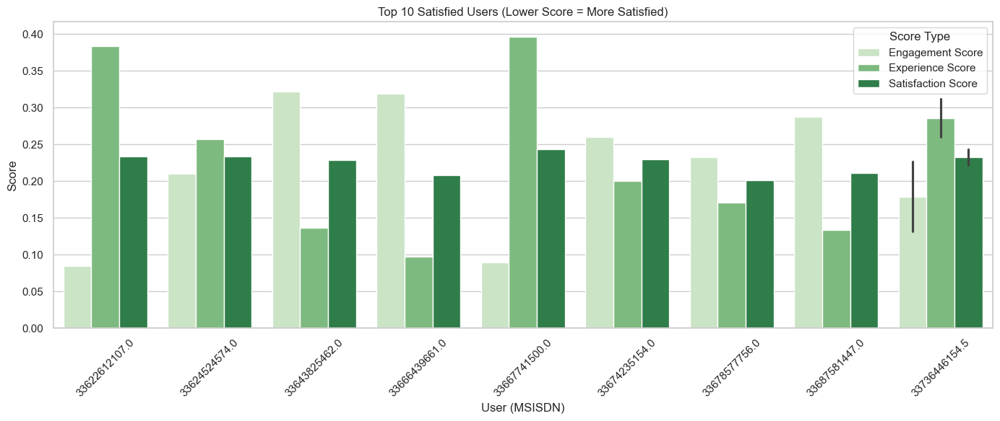

In [139]:
###visulize top 10 customer Satisfied
import pandas as pd
import matplotlib.pyplot as plt

# Melt the dataframe for plotting
melted = top_10_satisfied.melt(
    id_vars='MSISDN',
    value_vars=['Engagement Score', 'Experience Score', 'Satisfaction Score'],
    var_name='Score Type',
    value_name='Score'
)

# Plot
plt.figure(figsize=(14, 6))
sns.barplot(data=melted, x='MSISDN', y='Score', hue='Score Type', palette='Greens')
plt.title('Top 10 Satisfied Users (Lower Score = More Satisfied)')
plt.xticks(rotation=45)
plt.xlabel('User (MSISDN)')
plt.ylabel('Score')
plt.tight_layout()
plt.show()


In [140]:
##ask 4.3 - Build a regression model of your choice to predict the satisfaction score of a customer.

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score

# Define features (excluding identifiers and satisfaction score)
features = [
    'Session Duration (min)', 
    'Total Traffic (MB)', 
    'session_count',
    'Avg TCP Retransmission', 
    'Avg RTT (ms)', 
    'Avg Throughput (kbps)'
]

# Drop NA values if any (optional)
df_model = df.dropna(subset=features + ['Satisfaction Score'])

X = df_model[features]
y = df_model['Satisfaction Score']


In [141]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [142]:
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)


RandomForestRegressor(random_state=42)

In [143]:
y_pred = rf.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"📈 Mean Absolute Error (MAE): {mae:.4f}")
print(f"🔢 R-squared (R²): {r2:.4f}")


📈 Mean Absolute Error (MAE): 0.0092
🔢 R-squared (R²): 0.9982


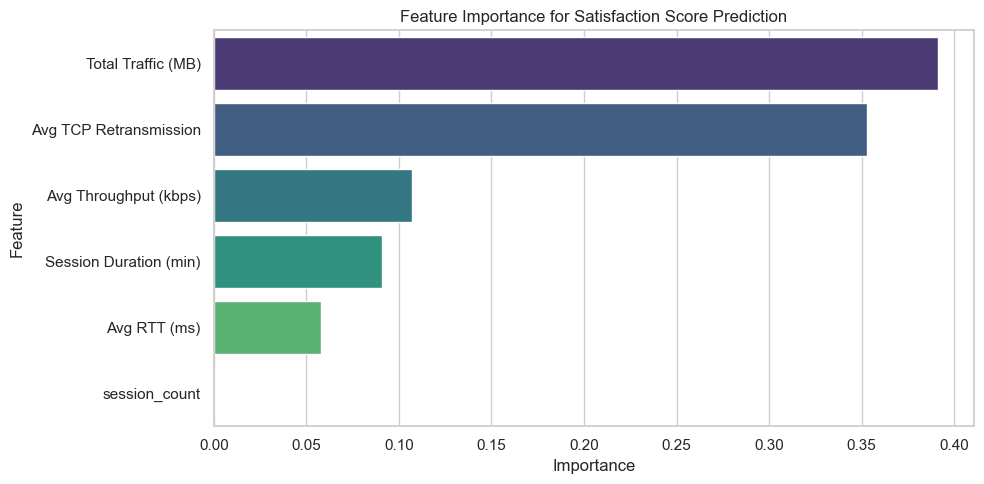

In [144]:
import seaborn as sns
import matplotlib.pyplot as plt

importances = rf.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': importances})
feature_importance_df.sort_values(by='Importance', ascending=False, inplace=True)

plt.figure(figsize=(10, 5))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature', palette='viridis')
plt.title('Feature Importance for Satisfaction Score Prediction')
plt.tight_layout()
plt.show()


In [145]:
###ask 4.4 - Run a k-means (k=3) on the engagement & the experience score
from sklearn.cluster import KMeans

# Select the relevant columns
score_df = df[['Engagement Score', 'Experience Score']].copy()

# Fit KMeans
kmeans = KMeans(n_clusters=2, random_state=42)
df['Satisfaction Cluster'] = kmeans.fit_predict(score_df)

# Check the result
df[['Engagement Score', 'Experience Score', 'Satisfaction Cluster']].head()


,Engagement Score,Experience Score,Satisfaction Cluster
0,1.489035,3.416772,0
1,0.158583,3.305558,0
2,1.649032,4.009997,0
3,0.749891,4.005905,0
4,0.443982,4.009997,0


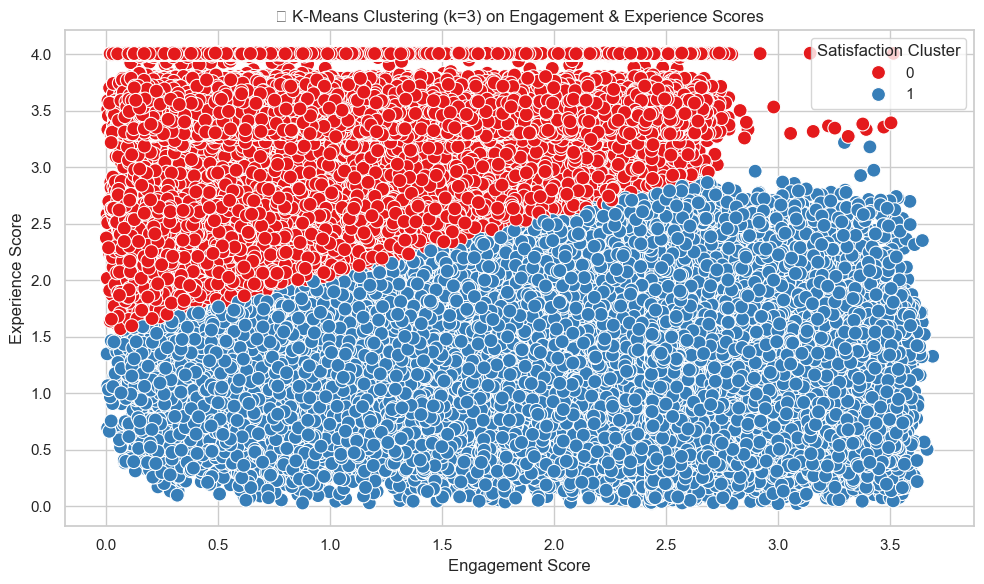

In [146]:
##Visualize the Clusters
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df, 
    x='Engagement Score', 
    y='Experience Score', 
    hue='Satisfaction Cluster', 
    palette='Set1',
    s=100
)
plt.title('🎯 K-Means Clustering (k=3) on Engagement & Experience Scores')
plt.xlabel('Engagement Score')
plt.ylabel('Experience Score')
plt.grid(True)
plt.tight_layout()
plt.show()


In [147]:
##Cluster 0 might represent users with low engagement and poor experience.

##Cluster 1 might group users who are highly engaged and satisfied.

##You can analyze the centroids or describe each cluster with:
df.groupby('Satisfaction Cluster')[['Engagement Score', 'Experience Score']].mean()


,Engagement Score,Experience Score
Satisfaction Cluster,,
0,1.069872,3.498152
1,2.222405,1.264671


In [148]:
##Task 4.5 - Aggregate the average satisfaction & experience score per cluster.
# Make sure Satisfaction Score column exists

# Aggregate average scores per cluster
cluster_scores = df.groupby('Satisfaction Cluster')[['Satisfaction Score', 'Experience Score']].mean().reset_index()

print(cluster_scores)


   Satisfaction Cluster  Satisfaction Score  Experience Score
0                     0            2.284012          3.498152
1                     1            1.743538          1.264671


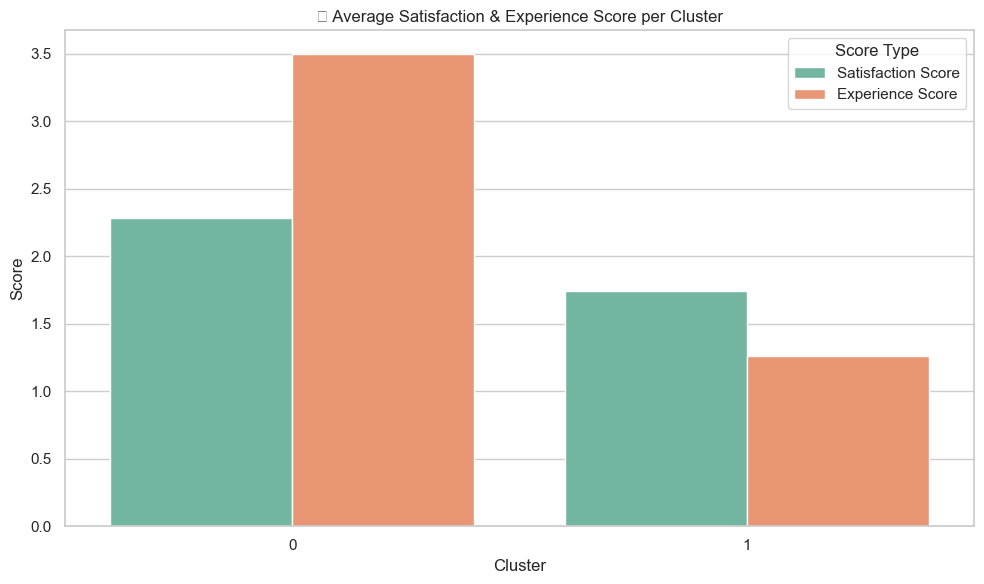

In [149]:
##Visualization
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.barplot(data=cluster_scores.melt(id_vars='Satisfaction Cluster'), 
            x='Satisfaction Cluster', y='value', hue='variable', palette='Set2')

plt.title("📊 Average Satisfaction & Experience Score per Cluster")
plt.ylabel("Score")
plt.xlabel("Cluster")
plt.legend(title="Score Type")
plt.tight_layout()
plt.show()


In [150]:
df =df.drop(columns=['Bearer Id', 'Start','End','Avg RTT DL (ms)','Avg RTT UL (ms)','Avg Bearer TP DL (kbps)','Avg Bearer TP UL (kbps)','TCP DL Retrans. Vol (Bytes)','TCP UL Retrans. Vol (Bytes)','DL TP < 50 Kbps (%)','50 Kbps < DL TP < 250 Kbps (%)','250 Kbps < DL TP < 1 Mbps (%)','DL TP > 1 Mbps (%)','UL TP < 10 Kbps (%)','10 Kbps < UL TP < 50 Kbps (%)','50 Kbps < UL TP < 300 Kbps (%)','UL TP > 300 Kbps (%)','HTTP DL (Bytes)','HTTP UL (Bytes)','Activity Duration DL (ms)','Activity Duration UL (ms)','Social Media DL (Bytes)','Social Media UL (Bytes)','Google DL (Bytes)','Google UL (Bytes)','Email DL (Bytes)','Email UL (Bytes)','Youtube DL (Bytes)','Youtube UL (Bytes)','Netflix DL (Bytes)','Netflix UL (Bytes)','Gaming DL (Bytes)','Gaming UL (Bytes)','Other DL (Bytes)','Other UL (Bytes)'])

In [151]:
df.to_csv('D:/New folder/telcom_data2.csv')

In [152]:
##Task 4.6 -* Export your final table containing all user ID + engagement, experience & satisfaction 
##scores in your local MySQL database. Report a screenshot of a select query output on the 
##exported table. 
import mysql.connector
from sqlalchemy import create_engine

In [153]:
cnx = mysql.connector.connect(
    user='root',
    password='1234',
    host='127.0.0.1',
    database='telecom_data2'
)

# Create a cursor object to execute SQL queries
cursor = cnx.cursor()

# Execute a SQL query to retrieve the data
query = "SELECT * FROM telcom_data2"
cursor.execute(query)

# Fetch the retrieved data
data = cursor.fetchall()

# Get the column names from the cursor object
column_names = [desc[0] for desc in cursor.description]

# Convert the data to a Pandas DataFrame with explicit column names
data = pd.DataFrame(data, columns=column_names)

# Close the cursor and connection
cursor.close()
cnx.close()
print(df)

        Start ms  End ms  session_duration          IMSI        MSISDN  \
0          341.0   872.0           86399.0  2.082014e+14  3.366496e+10   
1          341.0   872.0           86399.0  2.082014e+14  3.368185e+10   
2          341.0   872.0           86399.0  2.082014e+14  3.373645e+10   
3          341.0   872.0           86399.0  2.082014e+14  3.373645e+10   
4          341.0   872.0           86399.0  2.082014e+14  3.369980e+10   
...          ...     ...               ...           ...           ...   
149996     341.0   872.0           86399.0  2.082014e+14  3.365069e+10   
149997     341.0   872.0           86399.0  2.082014e+14  3.366345e+10   
149998     341.0   872.0           86399.0  2.082014e+14  3.362189e+10   
149999     341.0   872.0           86399.0  2.082014e+14  3.361962e+10   
150000     341.0   872.0           86399.0  2.082014e+14  3.373645e+10   

                IMEI Last Location Name   Dur. (ms).1 Handset Manufacturer  \
0       3.552121e+13        9.164

In [154]:
# Select only the columns you need
df = df[['User ID', 'Engagement Score', 'Experience Score', 'Satisfaction Score']]

# Rename them to avoid spaces (clean column names for SQL)
##df.columns = ['user_id', 'engagement_score', 'experience_score', 'satisfaction_score']


In [155]:
# Rename and select in one go
#Rename the MSSubClass name columns to Type of Dwelling
df.rename(columns={'User ID' : 'user_id' },inplace = True)
df.rename(columns={'Engagement Score' : 'engagement_score' },inplace = True)
df.rename(columns={'Experience Score' : 'experience_score' },inplace = True)
df.rename(columns={'Satisfaction Score' : 'satisfaction_score' },inplace = True)

In [156]:
df.head(2)

,user_id,engagement_score,experience_score,satisfaction_score
0,3.366496e+10,1.489035,3.416772,2.452904
1,3.368185e+10,0.158583,3.305558,1.732071


In [157]:
df.columns

Index(['user_id', 'engagement_score', 'experience_score',
       'satisfaction_score'],
      dtype='object')

In [158]:
import mysql.connector

# Connect to local MySQL
conn = mysql.connector.connect(
    host='127.0.0.1',
    user='root',
    password='1234',
    database='telecom_data2'
)

cursor = conn.cursor()

# Create table (updated datatype: using BIGINT for bearer_id if it's a large integer like MSISDN)
cursor.execute("""
CREATE TABLE IF NOT EXISTS user_scores (
    user_id BIGINT PRIMARY KEY,
    engagement_score FLOAT,
    experience_score FLOAT,
    satisfaction_score FLOAT
)
""")

# Commit and close connection
conn.commit()
cursor.close()
conn.close()

print("Table 'user_scores' created successfully.")


Table 'user_scores' created successfully.


In [159]:
df.columns

Index(['user_id', 'engagement_score', 'experience_score',
       'satisfaction_score'],
      dtype='object')

In [160]:
##Mandatory: Task 4.7 Model deployment tracking- deploy the model and monitor your model. Here 
##you can use Docker or other MlOps tools which can help you to track your model’s change.  Your 
##model tracking report includes code version, start and end time, source, parameters, metrics (loss 
##convergence), and artifacts or any output file regarding each specific run. (CSV file, screenshot) 



In [161]:
import mlflow

# Manually end the currently active run
mlflow.end_run()


In [162]:
import mlflow

# End any run that might be lingering
if mlflow.active_run():
    mlflow.end_run()

# Now safely start a new run
with mlflow.start_run():
    # tracking, training, logging
    ...


In [163]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import mlflow
import mlflow.sklearn
import time

# Load your data
df = pd.read_csv(r"D:\New folder\telcom_data2.csv")

# Example preprocessing (customize as needed)
X = df[["Experience Score","Engagement Score"]]
y = df["Satisfaction Score"]

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Start MLflow run
with mlflow.start_run():

    # Log parameters
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    mlflow.log_param("model_type", "RandomForest")
    mlflow.log_param("n_estimators", 100)

    # Training start time
    start_time = time.time()

    model.fit(X_train, y_train)

    # Training end time
    end_time = time.time()
    mlflow.log_param("start_time", start_time)
    mlflow.log_param("end_time", end_time)

    # Predictions and metrics
    preds = model.predict(X_test)
    mse = mean_squared_error(y_test, preds)
    mlflow.log_metric("mse", mse)

    # Log model artifact
    mlflow.sklearn.log_model(model, "model")

    # Save predictions
    pred_df = pd.DataFrame({"actual": y_test, "predicted": preds})
    pred_df.to_csv("predictions.csv", index=False)
    mlflow.log_artifact("predictions.csv")

    print("Model tracked with MLflow!")


2025/04/23 22:14:05 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model tracked with MLflow!


In [164]:
df.columns

Index(['Unnamed: 0', 'Start ms', 'End ms', 'session_duration', 'IMSI',
       'MSISDN', 'IMEI', 'Last Location Name', 'Dur. (ms).1',
       'Handset Manufacturer', 'Handset Type',
       'Nb of sec with 125000B < Vol DL',
       'Nb of sec with 1250B < Vol UL < 6250B',
       'Nb of sec with 31250B < Vol DL < 125000B',
       'Nb of sec with 37500B < Vol UL',
       'Nb of sec with 6250B < Vol DL < 31250B',
       'Nb of sec with 6250B < Vol UL < 37500B',
       'Nb of sec with Vol DL < 6250B', 'Nb of sec with Vol UL < 1250B',
       'total_UL', 'total_DL', 'session_count', 'RTT', 'Total Data (DL+UL)',
       'Total TCP Retransmission', 'Social Media Data', 'Google Data',
       'YouTube Data', 'Netflix Data', 'Gaming Data', 'Other Data',
       'total_data', 'User ID', 'Session Date', 'Session Start Time',
       'Session Duration (ms)', 'Session End Time', 'Session Duration (min)',
       'Total Traffic', 'Total Traffic (MB)', 'App_Code', 'Application',
       'Avg RTT (ms)', 'Avg Th